In [1]:
import warnings
# just for visualization
warnings.filterwarnings('ignore')

In [2]:
%reset -f
import xarray as xr
import numpy as np
import aoespy as ap
import matplotlib.pyplot as plt

## Moisture Budget Analysis Plots

data directory on COLA - /shared/CAREER_PWC/DeepMIP_Eocene

In [3]:
data=ap.load("/project/CAREER_PWC/nburls/DeepMIP_Eocene/DeepMIP_Eocene_Hydro/data/DeepmipEocene_processed_data_Jan2023.npz")
s=(ap.array(data.files)).astype(str)
for i in range(len(s)):
	ii=str(s[i]); print(ii)
	e=ii+"=data['"+ii+"']";
	exec(e)

sftlf
ts
pr
ev
ps
q
v
u
lon
lat
lev


In [4]:
dir='/shared/CAREER_PWC/DeepMIP-Eocene/User_Model_Database_v1.0/'
mdir=['CESM','COSMOS','GFDL','HadCM3','HadCM3','INMCM','IPSL','MIROC','NorESM']
model=['CESM1.2_CAM5','COSMOS-landveg_r2413','GFDL_CM2.1','HadCM3B_M2.1aN','HadCM3BL_M2.1aN','INM-CM4-8','IPSLCM5A2','MIROC4m','NorESM1_F']

proj=['piControl','deepmip_sens_1xCO2','deepmip_sens_2xCO2','deepmip_stand_3xCO2','deepmip_sens_4xCO2',\
      'deepmip_stand_6xCO2','deepmip_sens_9xCO2']

model_name=['CESM','COSMOS','GFDL','HadCM3B','HadCM3BL','INMCM','IPSL','MIROC','NorESM']
proj_name=['PI Control','1xCO2','2xCO2','3xCO2','4xCO2',\
      '6xCO2','9xCO2']

### Moisture Budget Analysis

**Moisture Budget Derivations**

Based on Trenberth and Guillemot 1995 and using somewhat similar notation.

∇∙$\vec{V}$ + ∂ω/∂p = 0  continuity equation (eqn 1)

Where V = u$\hat{i}$ + v$\hat{j}$, ω is the vertical velocity on pressure coordinate (Pa/s), and p is the pressure level (Pa).

w = ∫$_0^∞$qρdz (eqn 2)

Where w the precipitable water defined as the vertical mass-weighted integral of specific humidity q (kg/kg) and ρ is the density of the air.

Employing the hydrostatic balance dp/dz = -gρ this can be written as:

w = ∫$_0^∞$qρdz = 1/g ∫$_0^{p_s}$qρdp (eqn 3)

Where p_s is the surface pressure. *Note the minus sign disappears because the bounds of the integral are flipped. 

Starting with the conservation of water vapor equation:

∂q/∂t + $\vec{V}$∙∇q + ω ∂q/∂p = e-c (eqn 4)

Where e is evaporation and c is condensation.

∇∙(q$\vec{V}$) = q∇∙$\vec{V}$ + $\vec{V}$∙∇q, using the continuity equation (eqn 1) ∇∙(q$\vec{V}$) = -q∂ω/∂p + $\vec{V}$∙∇q, or $\vec{V}$∙∇q = ∇∙(q$\vec{V}$) + q∂ω/∂p. Substituting this, eqn 4 can be expressed in flux form:

∂q/∂t + ∇∙(q$\vec{V}$) + q∂ω/∂p + ω∂q/∂p = ∂q/∂t + ∇∙q$\vec{V}$ + ∂(ωq)/∂p = e-c (eqn 5)

For the vertical integral of eqn 5

1/g∫$_0^{p_s}$∂q/∂tdp + 1/g∫$_0^{p_s}$∇∙(q$\vec{V}$)dp + 1/g∫$_0^{p_s}$∂(ωq)/∂pdp = E-P (eqn 6)

Noting the generic relationship for any A

∂(∫$_0^{p_s}$qdp)/∂t = ∫$_0^{p_s}$∂A/∂tdp + $A_s$∂$p_s$/∂t   Leibniz integral rule (eqn 7a)

∇∙∫$_0^{p_s}$A$\vec{V}$dp = ∫$_0^{p_s}$∇∙(q$\vec{V}$)dp + A_s$\vec{V}_s$∙∇$p_s$   Leibniz integral rule (eqn 7b)

∫$_0^{p_s}$∂Aω/∂pdp = $A_s$$ω_s$ = $A_s$(∂$p_s$/∂t + $\vec{V}_s$∙∇$p_s$) (eqn 7c)

Equ 6 can be rewritten as

∂(1/g∫$_0^{p_s}$qdp)/∂t  - 1/g$q_s$∂$p_s$/∂t + ∇∙1/g∫$_0^{p_s}$q$\vec{V}$dp - 1/g$q_s$$\vec{V}_s$∙∇$p_s$ + 1/gq∂$p_s$/∂t   + 1/gq$\vec{V}_s$∙∇$p_s$ =

∂(1/g∫$_0^{p_s}$qdp)/∂t + ∇∙1/g∫$_0^{p_s}$q$\vec{V}$dp = E-P 

∂w/∂t + ∇∙1/g∫$_0^{p_s}$q$\vec{V}$dp = E-P (eqn 8)


## Define functions

In [5]:
def spheric_dist(lat1,lat2,lon1,lon2):

    R=6367442.76
    # %  Determine proper longitudinal shift.

    l=np.absolute(lon2-lon1)

    l[l>=180]=360-l[l>=180]

    #                  
    #   Convert Decimal degrees to radians.
    # 
    deg2rad=np.pi/180
    lat1=lat1*deg2rad
    lat2=lat2*deg2rad
    l=l*deg2rad

    # 
    #   Compute the distances using Haversine formula
    # 
    
    dist=R*np.arcsin(np.sqrt(((np.sin(l)*np.cos(lat2))**2)+(((np.sin(lat2)*np.cos(lat1))-(np.sin(lat1)*np.cos(lat2)*np.cos(l)))**2)))

    return dist

In [6]:
def get_grid_area(lon_rho,lat_rho):

    I, J=lon_rho.shape
    lon_u=np.zeros((I+1,J))
    lon_u[1:-1,:]=0.5*(lon_rho[0:-1,:]+lon_rho[1:,:])
    lon_u[0,:]=lon_rho[0,:]-0.5*(lon_rho[1,:]-lon_rho[0,:])
    lon_u[-1,:]=lon_rho[-1,:]+0.5*(lon_rho[-1,:]-lon_rho[-2,:])

    lat_u=np.zeros((I+1,J))
    lat_u[1:-1,:]=0.5*(lat_rho[0:-1,:]+lat_rho[1:,:])
    lat_u[0,:]=lat_rho[0,:]-0.5*(lat_rho[1,:]-lat_rho[0,:])
    lat_u[-1,:]=lat_rho[-1,:]+0.5*(lat_rho[-1,:]-lat_rho[-2,:])

    lon_v=np.zeros((I,J+1))
    lon_v[:,1:-1]=0.5*(lon_rho[:,0:-1]+lon_rho[:,1:])
    lon_v[:,0]=lon_rho[:,0]-0.5*(lon_rho[:,1]-lon_rho[:,0])
    lon_v[:,-1]=lon_rho[:,-1]+0.5*(lon_rho[:,-1]-lon_rho[:,-2])

    lat_v=np.zeros((I,J+1))
    lat_v[:,1:-1]=0.5*(lat_rho[:,0:-1]+lat_rho[:,1:])
    #lat_v[:,0]=lat_rho[:,0]-0.5*(lat_rho[:,1]-lat_rho[:,0])
    #lat_v[:,-1]=lat_rho[:,-1]+0.5*(lat_rho[:,-1]-lat_rho[:,-2])
    lat_v[:,0]=-90
    lat_v[:,-1]=90

    dx_rho=np.zeros((I,J))
    dx_rho=spheric_dist(lat_u[0:-1,:],lat_u[1:,:],lon_u[0:-1,:],lon_u[1:,:])
    dy_rho=np.zeros((I,J))
    dy_rho=spheric_dist(lat_v[:,0:-1],lat_v[:,1:], lon_v[:,0:-1],lon_v[:,1:])

    A=dy_rho*dx_rho
    return (A, dx_rho, dy_rho, lat_v, lon_v, lat_u, lon_u)

In [7]:
def meridi_moist_div(VQBar,dp,dx_midy):
    
    g = 9.81 # gravitational constant
    rho_fw = 1000.0; # density of fresh water (kg/m^3)
    
    # Vertically integrate
    VQBardp = VQBar*dp;  # kg/kg m/s Pa
    dp_naned = np.where(np.isnan(VQBardp),np.nan,dp)
    VQBar_2D = np.nansum(VQBardp,0)/np.nansum(dp_naned,0)*1000; #converted to g/kg m/s
    
    VQBar_vertinterp = (1/g)*np.nansum(VQBardp,0); # in kg/m/s (kg/kg m/s Pa s^2/m -> kg/kg m/s kg/m/s^2 s^2/m) 
    # VQBar_vertinterp has the units of kg/m/s 
    # convert to m^2/s by dividing by water density and then multiply by y or x distance (m) to get m^3/s
    VQBar_vertinterp_mid = VQBar_vertinterp[0:-1,:]+((VQBar_vertinterp[1:,:]-VQBar_vertinterp[0:-1,:])/dy_mid)*0.5*dy[0:-1,:];

    VQBar_transport = np.zeros([nlat+1,nlon])
    VQBar_transport[1:-1,:] = VQBar_vertinterp_mid/rho_fw*dx_midy; # m^3/s
    
    VQBar_div = VQBar_transport[1:,:]-VQBar_transport[0:-1,:]; # m^3/s

    return (VQBar_2D, VQBar_transport, VQBar_div)

In [8]:
def zonal_moist_div(UQBar,dp,dy_midx):

    g = 9.81 #gravitational constant
    rho_fw = 1000.0;      # density of fresh water (kg/m^3)
    
    # Vertically integrate
    UQBardp = UQBar*dp;  # kg/kg m/s Pa
    dp_naned = np.where(np.isnan(UQBardp),np.nan,dp)
    UQBar_2D = np.nansum(UQBardp,0)/np.nansum(dp_naned,0)*1000; #converted to g/kg m/s
    
    UQBar_vertinterp = (1/g)*np.nansum(UQBardp,0); # in kg/m/s (kg/kg m/s Pa s^2/m -> kg/kg m/s kg/m/s^2 s^2/m) 
    # UQBar_vertinterp has the units of kg/m/s 
    # convert to m^2/s by dividing by water density and then multiply by y or x distance (m) to get m^3/s
    UQBar_vertinterp_mid = UQBar_vertinterp[:,0:-1]+((UQBar_vertinterp[:,1:]-UQBar_vertinterp[:,0:-1])/dx_mid)*0.5*dx[:,0:-1];
    UQBar_vertinterp_wrap = UQBar_vertinterp[:,-1]+(UQBar_vertinterp[:,0]-UQBar_vertinterp[:,-1])/((dx[:,0]+dx[:,-1])/2)*0.5*dx[:,-1];
    
    UQBar_transport = np.zeros([nlat,nlon+1])
    UQBar_transport[:,1:-1] = UQBar_vertinterp_mid/rho_fw*dy_midx; # m^3/s
    UQBar_transport[:,0] = UQBar_vertinterp_wrap/rho_fw*(dy[:,0]+dy[:,-1])/2; 
    UQBar_transport[:,-1] = UQBar_vertinterp_wrap/rho_fw*(dy[:,0]+dy[:,-1])/2; 

    UQBar_div = UQBar_transport[:,1:]-UQBar_transport[:,0:-1]; # m^3/s
    
    return (UQBar_2D, UQBar_transport, UQBar_div)

In [9]:
def get_psi(v,dp,lat,lev):  

#
# v (meridional wind) and dp (change in pressure) should have dims of lev, lat, lon.    
# Computes zonal mean stream function (PSI)
#
#                                                           / ps(lat,lon)
#                                                          |
#                                          2 pi a cos(lat) | 
#                   PSI(lev,lat,lon)  =   --------------- |  V(lev,lat,lon) dp
#                                                g         |
#                                                          |
#                                                         / p(lev,lat,lon)
# 
    g = 9.81 # gravitational constant (rounding up 9.80616)
    pi = 3.141593  # The value of pi in radians.
    a = 6.37122e6 # Radius of earth, m.
    
    Vdp = v*dp;  # m/s Pa
    Vdp_zm=np.nanmean(Vdp[:,:,:],2)
    
    psi = np.zeros([len(lev),len(lat)])*np.nan
    psi_tmp = np.zeros([len(lev)+1,len(lat)])
    psi_tmp[1:,:] = psi_tmp[1:,:]*np.nan
    for j in range(len(lat)):
        c = 2*pi*a*np.cos(lat[j]*pi/180)/g; # multiplicative constant of integral 
        for l in range(len(lev)):
            tmp=c*np.nansum(Vdp_zm[0:l,j],0);
            psi_tmp[l+1,j] = tmp
    psi = (psi_tmp[0:-1,:]+psi_tmp[1:,:])/2

    return (psi)

In [10]:
# Calculate dx, dy and Area 
[lat_rho,lon_rho]=np.meshgrid(lat,lon);
(A, dx, dy, lat_v, lon_v, lat_u, lon_u)=get_grid_area(lon_rho,lat_rho)
A = np.swapaxes(A,0,1)
dx = np.swapaxes(dx,0,1)
dy = np.swapaxes(dy,0,1)

In [11]:
dx_midy = (dx[0:-1,:]+dx[1:,:])/2;
dy_midx = (dy[:,0:-1]+dy[:,1:])/2; 
dx_mid = (dx[:,0:-1]+dx[:,1:])/2;
dy_mid = (dy[0:-1,:]+dy[1:,:])/2; 

In [12]:
[nlvl,nlat,nlon,mod,exp] = q[:,:,:,:].shape

In [13]:
# flip height dimension so top to botton
lev_flip=np.flip(lev, 0)
q_flip=np.flip(q, 0) 
v_flip=np.flip(v, 0) 
u_flip=np.flip(u, 0) 

In [14]:
p = np.empty([nlvl,nlat,nlon,mod,exp])
for j in range(nlat):
    for i in range(nlon):
        for k in range(mod):
            for l in range(exp):
                p[:,j,i,k,l] = lev_flip*100 # convert from hPa to Pa

In [15]:
p_zm=np.nanmean(p[:,:,:,0,0],2)
p_zm[:,50]

array([   350.,    750.,   1400.,   2500.,   3800.,   5400.,   7200.,
         8700.,  10300.,  12100.,  14200.,  16800.,  19700.,  23300.,
        27400.,  32200.,  37900.,  44600.,  52500.,  61000.,  69100.,
        76300.,  82100.,  86000.,  88700.,  91300.,  93600.,  95700.,
        97600.,  99200., 100000.])

In [16]:
p_naned = np.where(np.isnan(q_flip),np.nan,p) # This does not do much because q, v and u are extrapolated

In [17]:
#p_naned_zm=np.nanmean(p_naned[:,:,:,0,0],2)
#p_naned_zm[:,50]

In [18]:
#plt.contourf(p_naned[-1,:,:,5,0])
#plt.colorbar()

In [19]:
# pressure at interface
p_i = np.empty([nlvl+1,nlat,nlon,mod,exp]) 
p_i[1:-1,:,:,:,:] = (p_naned[0:-1,:,:,:,:]+p_naned[1:,:,:,:,:])/2
#p_i[0,:,:,:,:] = 225.52395239 # Pa -> 2.25523952 hPa
p_i[0,:,:,:,:] = 500 # Pa -> 5 hPa
p_i[-1,:,:,:,:] = ps # ps is in Pa
#p_i_ps = np.where(np.isnan(p_i),ps,p_i)
p_i_ps = np.where(p_i>=ps,ps,p_i) #This will cause dp to be zero for all grid points below group

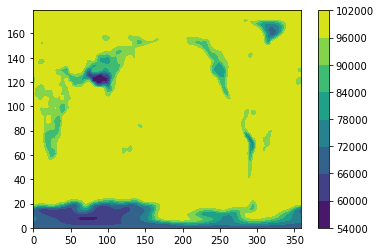

In [20]:
cs=plt.contourf(p_i_ps[-2,:,:,0,0])
plt.colorbar(cs)

In [21]:
#p_i_zm=np.nanmean(p_i[:,:,:,0,0],2)
#p_i_zm[:,50]

In [22]:
#p_i_ps_zm=np.nanmean(p_i_ps[:,:,:,0,0],2)
#p_i_ps_zm[:,50]

In [23]:
# Calculate the pressure change (dp) for each grid cell
dp = p_i_ps[1:,:,:,:,:]-p_i_ps[0:-1,:,:,:,:]

In [24]:
dp_naned1 = np.where(np.isnan(q_flip),np.nan,dp)
dp_naned = np.where(dp_naned1<=0,np.nan,dp)

In [25]:
# To nan out in both PI and exp but naning out both dp and q, v and u
#q_flip = np.where(np.isnan(dp_naned),np.nan,q_flip)
#v_flip = np.where(np.isnan(dp_naned),np.nan,v_flip)
#u_flip = np.where(np.isnan(dp_naned),np.nan,u_flip)

**Calculate Moisture budget and its Decomp** 

In [26]:
VbarQbar_2D = np.zeros([nlat,nlon,mod,exp])*np.nan
VbarQbar_transport = np.zeros([nlat+1,nlon,mod,exp])*np.nan
VbarQbar_div = np.zeros([nlat,nlon,mod,exp])*np.nan

UbarQbar_2D = np.zeros([nlat,nlon,mod,exp])*np.nan
UbarQbar_transport = np.zeros([nlat,nlon+1,mod,exp])*np.nan
UbarQbar_div = np.zeros([nlat,nlon,mod,exp])*np.nan

VcntQanobar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
VcntQanobar_transport = np.zeros([nlat+1,nlon,mod,exp-1])*np.nan
VcntQanobar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan
VanoQcntbar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
VanoQcntbar_transport = np.zeros([nlat+1,nlon,mod,exp-1])*np.nan
VanoQcntbar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan
VanoQanobar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
VanoQanobar_transport = np.zeros([nlat+1,nlon,mod,exp-1])*np.nan
VanoQanobar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan

UcntQanobar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
UcntQanobar_transport = np.zeros([nlat,nlon+1,mod,exp-1])*np.nan
UcntQanobar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan
UanoQcntbar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
UanoQcntbar_transport = np.zeros([nlat,nlon+1,mod,exp-1])*np.nan
UanoQcntbar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan
UanoQanobar_2D = np.zeros([nlat,nlon,mod,exp-1])*np.nan
UanoQanobar_transport = np.zeros([nlat,nlon+1,mod,exp-1])*np.nan
UanoQanobar_div = np.zeros([nlat,nlon,mod,exp-1])*np.nan

Moisture_Div_mean_thermo = np.zeros([nlat,nlon,mod,exp-1])*np.nan
Moisture_Div_mean_dynamic = np.zeros([nlat,nlon,mod,exp-1])*np.nan
Moisture_Div_mean_pert = np.zeros([nlat,nlon,mod,exp-1])*np.nan

Moisture_Div_mean = np.zeros([nlat,nlon,mod,exp])*np.nan

for k in range(mod):
    for l in range(exp):
        if l == 0:
            VbarQbar=v_flip[:,:,:,k,l]*q_flip[:,:,:,k,l]
            if np.isnan(np.nanmean(np.nanmean(np.nanmean(VbarQbar,0),0),0))==False:
                (VbarQbar_2D[:,:,k,l],VbarQbar_transport[:,:,k,l], VbarQbar_div[:,:,k,l]) = meridi_moist_div(VbarQbar,dp_naned[:,:,:,k,l],dx_midy)
                UbarQbar=u_flip[:,:,:,k,l]*q_flip[:,:,:,k,l]
                (UbarQbar_2D[:,:,k,l],UbarQbar_transport[:,:,k,l], UbarQbar_div[:,:,k,l]) = zonal_moist_div(UbarQbar,dp_naned[:,:,:,k,l],dy_midx)
        else:
            VbarQbar=v_flip[:,:,:,k,l]*q_flip[:,:,:,k,l]
            if np.isnan(np.nanmean(np.nanmean(np.nanmean(VbarQbar,0),0),0))==False:
                    (VbarQbar_2D[:,:,k,l],VbarQbar_transport[:,:,k,l], VbarQbar_div[:,:,k,l]) = meridi_moist_div(VbarQbar,dp_naned[:,:,:,k,l],dx_midy)
                    UbarQbar=u_flip[:,:,:,k,l]*q_flip[:,:,:,k,l]
                    (UbarQbar_2D[:,:,k,l],UbarQbar_transport[:,:,k,l], UbarQbar_div[:,:,k,l]) = zonal_moist_div(UbarQbar,dp_naned[:,:,:,k,l],dy_midx)
                    # Plus futher decomp into dynamic and thermodynamic
                    VcntQanobar=v_flip[:,:,:,k,0]*(q_flip[:,:,:,k,l]-q_flip[:,:,:,k,0])
                    (VcntQanobar_2D[:,:,k,l-1],VcntQanobar_transport[:,:,k,l-1],VcntQanobar_div[:,:,k,l-1]) = meridi_moist_div(VcntQanobar,dp_naned[:,:,:,k,l],dx_midy)
                    VanoQcntbar=(v_flip[:,:,:,k,l]-v_flip[:,:,:,k,0])*q_flip[:,:,:,k,0]
                    (VanoQcntbar_2D[:,:,k,l-1],VanoQcntbar_transport[:,:,k,l-1],VanoQcntbar_div[:,:,k,l-1]) = meridi_moist_div(VanoQcntbar,dp_naned[:,:,:,k,l],dx_midy)
                    VanoQanobar=(v_flip[:,:,:,k,l]-v_flip[:,:,:,k,0])*(q_flip[:,:,:,k,l]-q_flip[:,:,:,k,0])
                    (VanoQanobar_2D[:,:,k,l-1],VanoQanobar_transport[:,:,k,l-1],VanoQanobar_div[:,:,k,l-1]) = meridi_moist_div(VanoQanobar,dp_naned[:,:,:,k,l],dx_midy)
                    UcntQanobar=u_flip[:,:,:,k,0]*(q_flip[:,:,:,k,l]-q_flip[:,:,:,k,0])
                    (UcntQanobar_2D[:,:,k,l-1],UcntQanobar_transport[:,:,k,l-1],UcntQanobar_div[:,:,k,l-1]) = zonal_moist_div(UcntQanobar,dp_naned[:,:,:,k,l],dy_midx)
                    UanoQcntbar=(u_flip[:,:,:,k,l]-u_flip[:,:,:,k,0])*q_flip[:,:,:,k,0]
                    (UanoQcntbar_2D[:,:,k,l-1],UanoQcntbar_transport[:,:,k,l-1],UanoQcntbar_div[:,:,k,l-1]) = zonal_moist_div(UanoQcntbar,dp_naned[:,:,:,k,l],dy_midx)
                    UanoQanobar=(u_flip[:,:,:,k,l]-u_flip[:,:,:,k,0])*(q_flip[:,:,:,k,l]-q_flip[:,:,:,k,0])
                    (UanoQanobar_2D[:,:,k,l-1],UanoQanobar_transport[:,:,k,l-1],UanoQanobar_div[:,:,k,l-1]) = zonal_moist_div(UanoQanobar,dp_naned[:,:,:,k,l],dy_midx)
                    Moisture_Div_mean_thermo[:,:,k,l-1] = (UcntQanobar_div[:,:,k,l-1]+VcntQanobar_div[:,:,k,l-1])/A; #m/s 
                    Moisture_Div_mean_dynamic[:,:,k,l-1] = (UanoQcntbar_div[:,:,k,l-1]+VanoQcntbar_div[:,:,k,l-1])/A; #m/s 
                    Moisture_Div_mean_pert[:,:,k,l-1] = (UanoQanobar_div[:,:,k,l-1]+VanoQanobar_div[:,:,k,l-1])/A; #m/s 
        Moisture_Div_mean[:,:,k,l] = (UbarQbar_div[:,:,k,l]+VbarQbar_div[:,:,k,l])/A; #m/s

**Plot Multi Panel Lat-Lon Plots**

In [27]:
# Cal P-E and convert from kg/m^2/s to mm/day -> ./1000.*1000.*86400
pe=(pr-ev)*86400
# Convert precip and evap from kg/m^2/s to mm/day -> ./1000.*1000.*86400
pr=pr*86400
ev=ev*86400

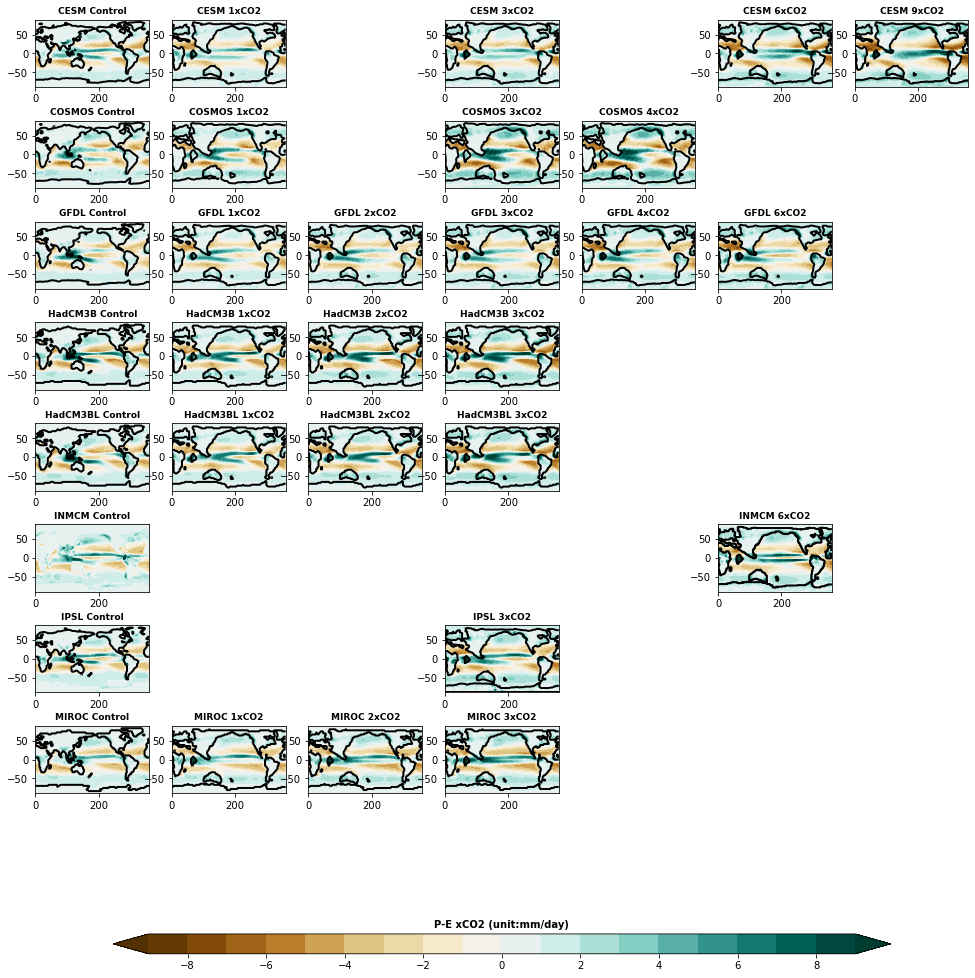

In [28]:
# Make multi panel p-e plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)):
        if np.isnan(np.nanmean(pe[:,:,i,j]))==False:
            plt.subplot(9,7,run)
            cs=plt.contourf(lon,lat,pe[:,:,i,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j], levels=[0.5], colors='black', linewidths=2)
            if j==0:
                plt.title(model_name[i]+' '+proj[j][-7:],fontsize=9,fontweight='bold')
            else:
                plt.title(model_name[i]+' '+proj[j][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('P-E xCO2 (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/pe.png',dpi=300)
plt.savefig('./plots/pe.pdf', format='pdf')
proj_pe=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=7)','4xCO2 (n=2)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

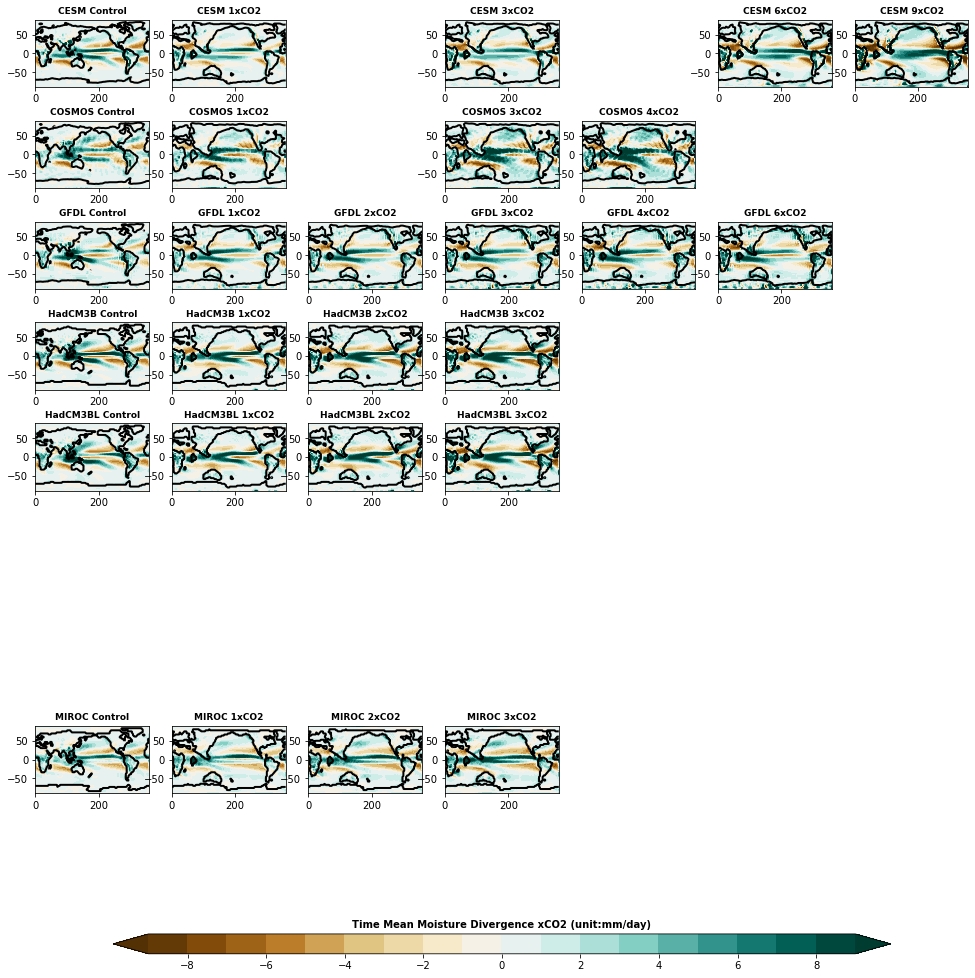

In [29]:
# Make multi panel mean moisture divergence plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j]*86400*1000))==False:
            plt.subplot(9,7,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j], levels=[0.5], colors='black', linewidths=2)
            if j==0:
                plt.title(model_name[i]+' '+proj[j][-7:],fontsize=9,fontweight='bold')
            else:
                plt.title(model_name[i]+' '+proj[j][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Moisture Divergence xCO2 (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean.pdf', format='pdf')
proj_pe=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=7)','4xCO2 (n=2)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

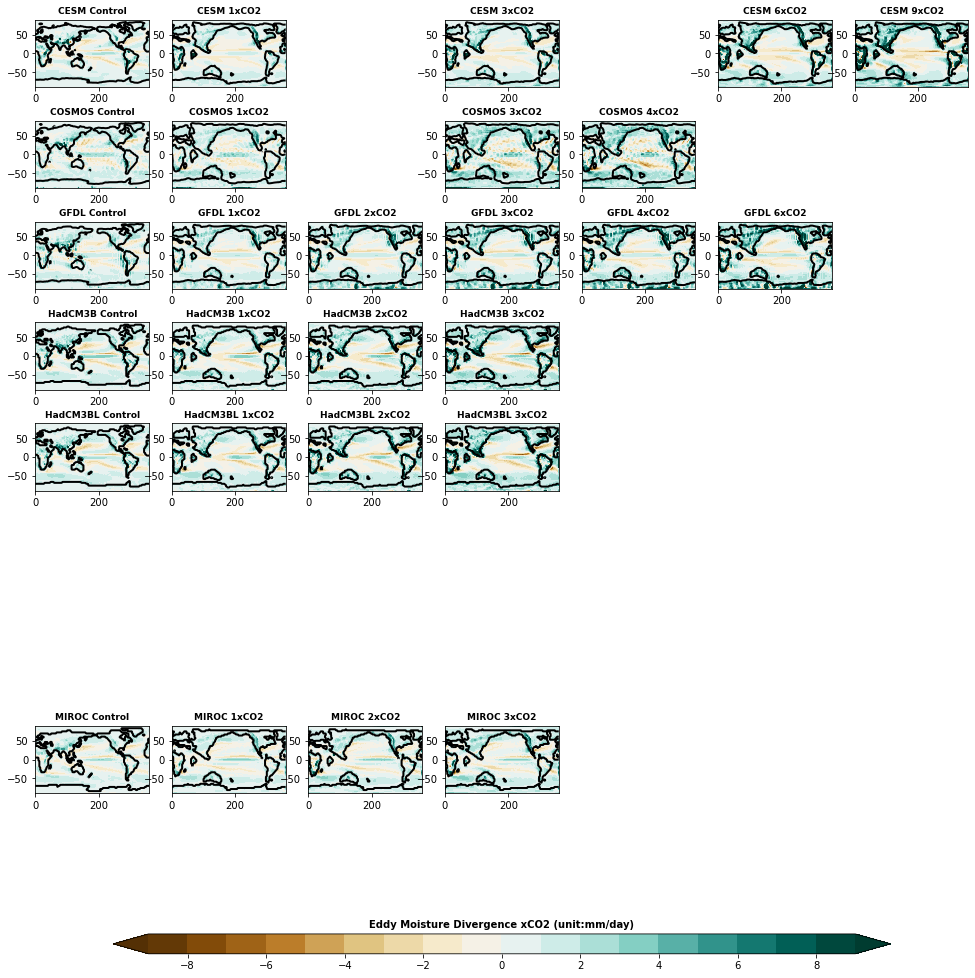

In [30]:
# Make multi panel eddy moisture divergence plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)):
        if np.isnan(np.nanmean(pe[:,:,i,j]+Moisture_Div_mean[:,:,i,j]*86400*1000))==False:
            plt.subplot(9,7,run)
            cs=plt.contourf(lon,lat,pe[:,:,i,j]+Moisture_Div_mean[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j], levels=[0.5], colors='black', linewidths=2)
            if j==0:
                plt.title(model_name[i]+' '+proj[j][-7:],fontsize=9,fontweight='bold')
            else:
                plt.title(model_name[i]+' '+proj[j][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Eddy Moisture Divergence xCO2 (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_eddy.png',dpi=300)
plt.savefig('./plots/Moisture_Div_eddy.pdf', format='pdf')
proj_pe=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=7)','4xCO2 (n=2)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

**Plot Multi Panel Lat-Lon Anomaly Plots**

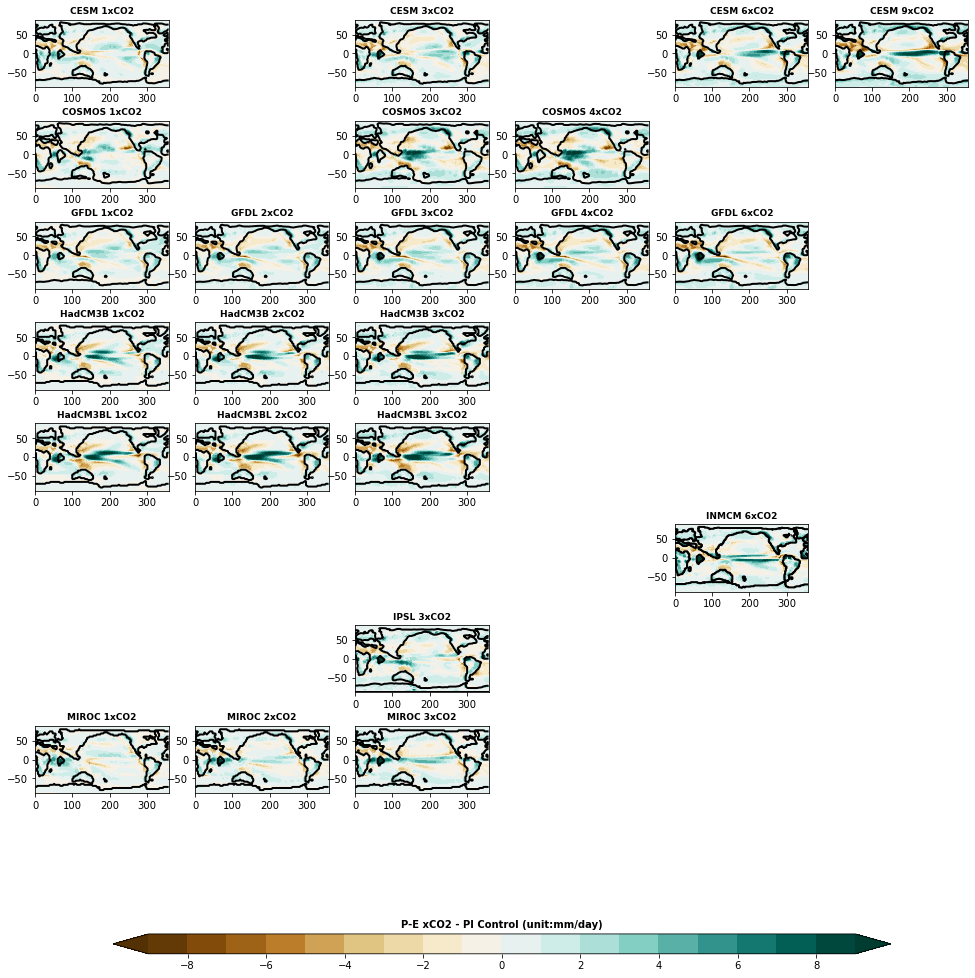

In [31]:
# Make multi panel P-E anomaly plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(pe[:,:,i,j+1]))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,pe[:,:,i,j+1]-pe[:,:,i,0], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('P-E xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/pefinal.png',dpi=300)
plt.savefig('./plots/peanofinal.pdf', format='pdf')
proj_pe=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=7)','4xCO2 (n=2)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

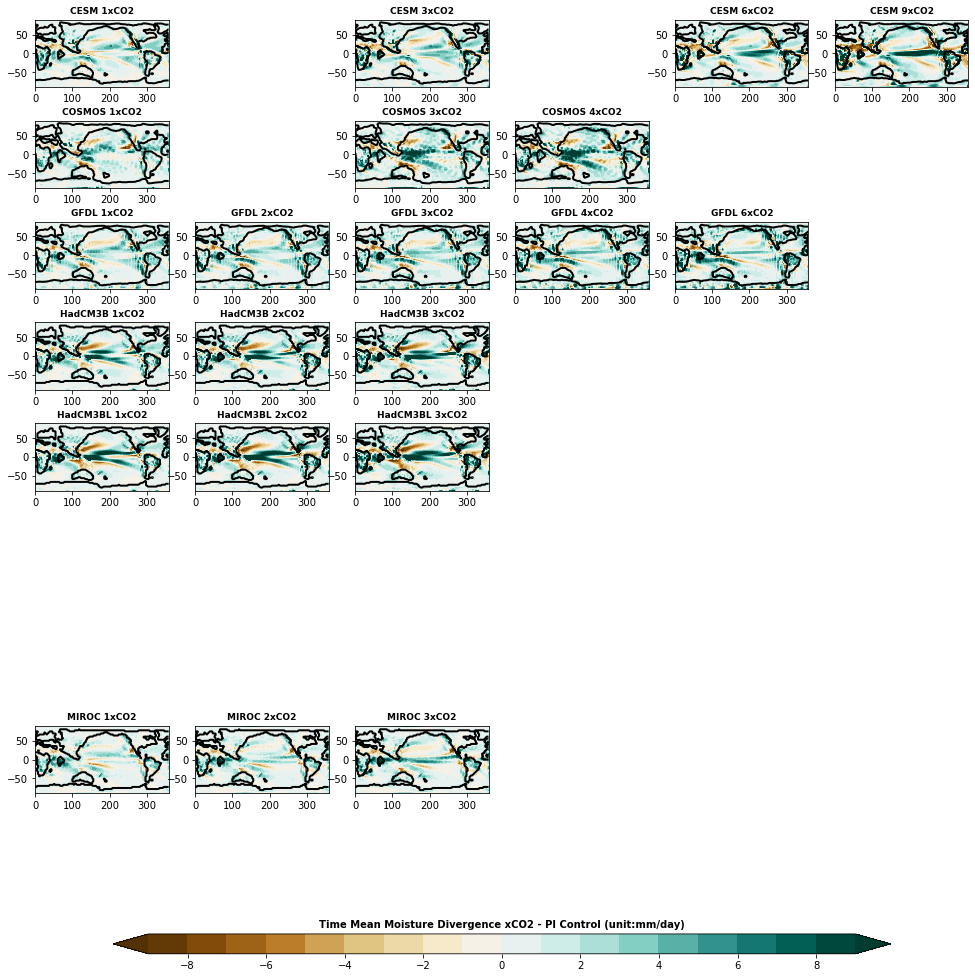

In [32]:
# Make multi panel mean moisture divergence anomaly plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean[:,:,i,j+1]*86400*1000+Moisture_Div_mean[:,:,i,0]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Moisture Divergence xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_ano.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_ano.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

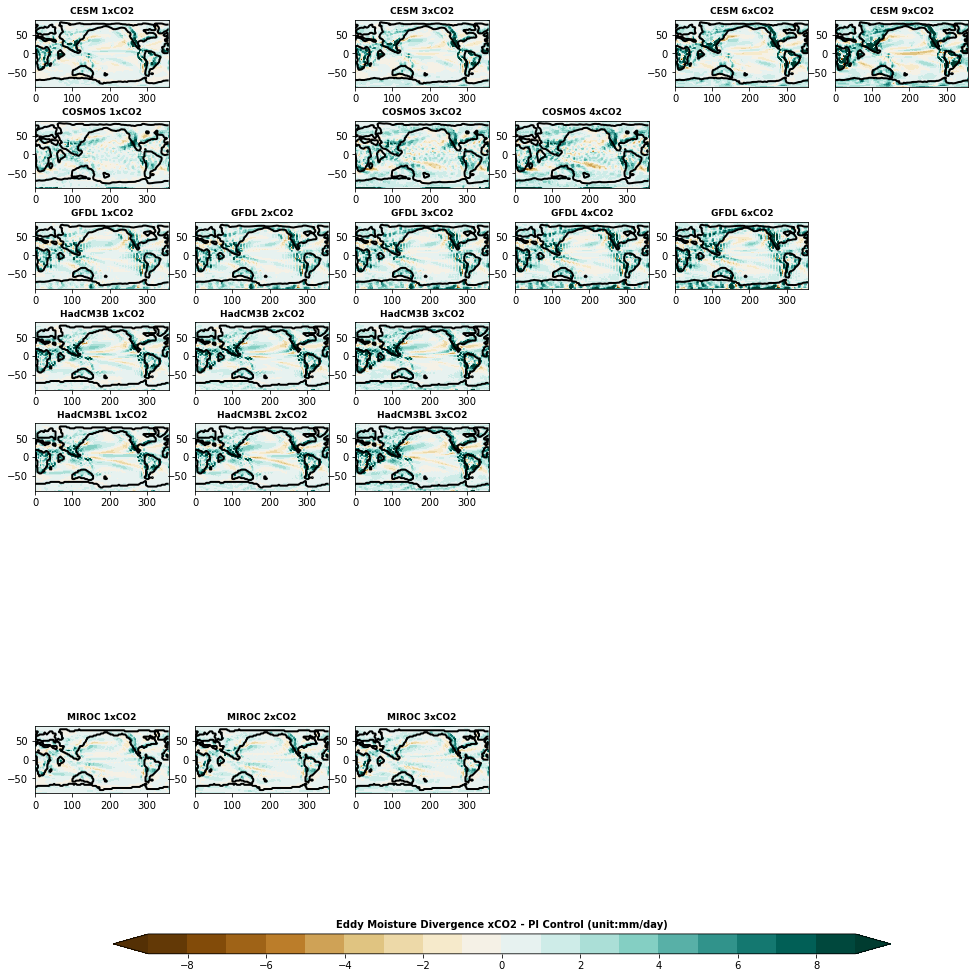

In [33]:
# Make multi panel eddy moisture divergence anomaly plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,pe[:,:,i,j+1]+Moisture_Div_mean[:,:,i,j+1]*86400*1000-pe[:,:,i,0]-Moisture_Div_mean[:,:,i,0]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Eddy Moisture Divergence xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_eddy_ano.png',dpi=300)
plt.savefig('./plots/Moisture_Div_eddy_ano.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

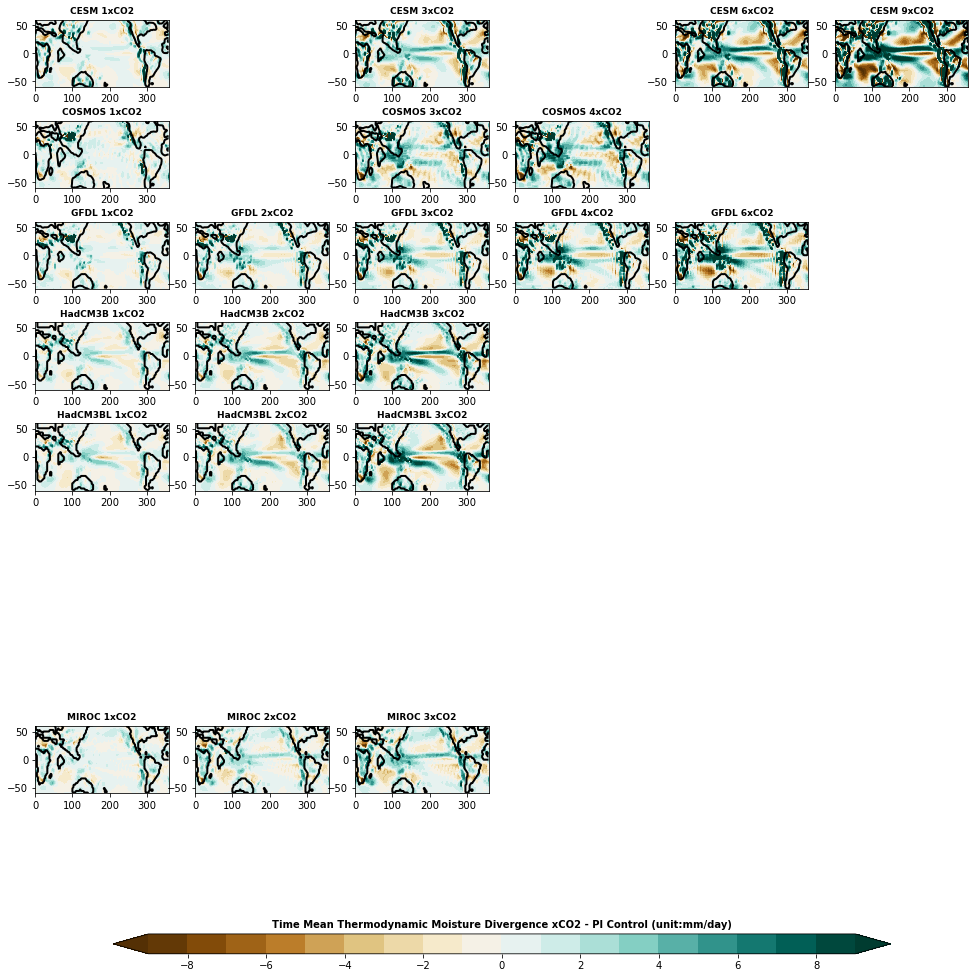

In [34]:
# Make multi panel mean thermodynamic moisture divergence plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean_thermo[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
            plt.ylim([-60, 60])
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Thermodynamic Moisture Divergence xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_thermo_ano.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_thermo_ano.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

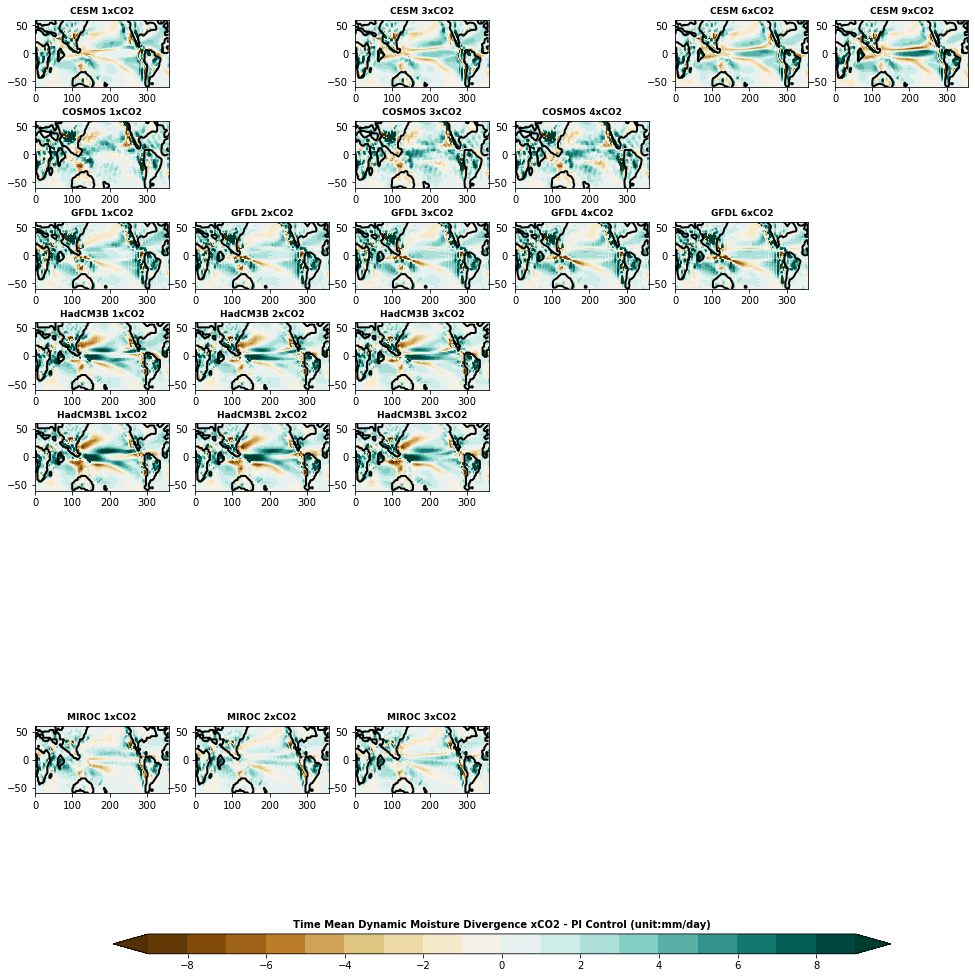

In [35]:
# Make multi panel mean dynamic moisture divergence plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean_dynamic[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
            plt.ylim([-60, 60])
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Dynamic Moisture Divergence xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_dynamic_ano.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_dynamic_ano.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

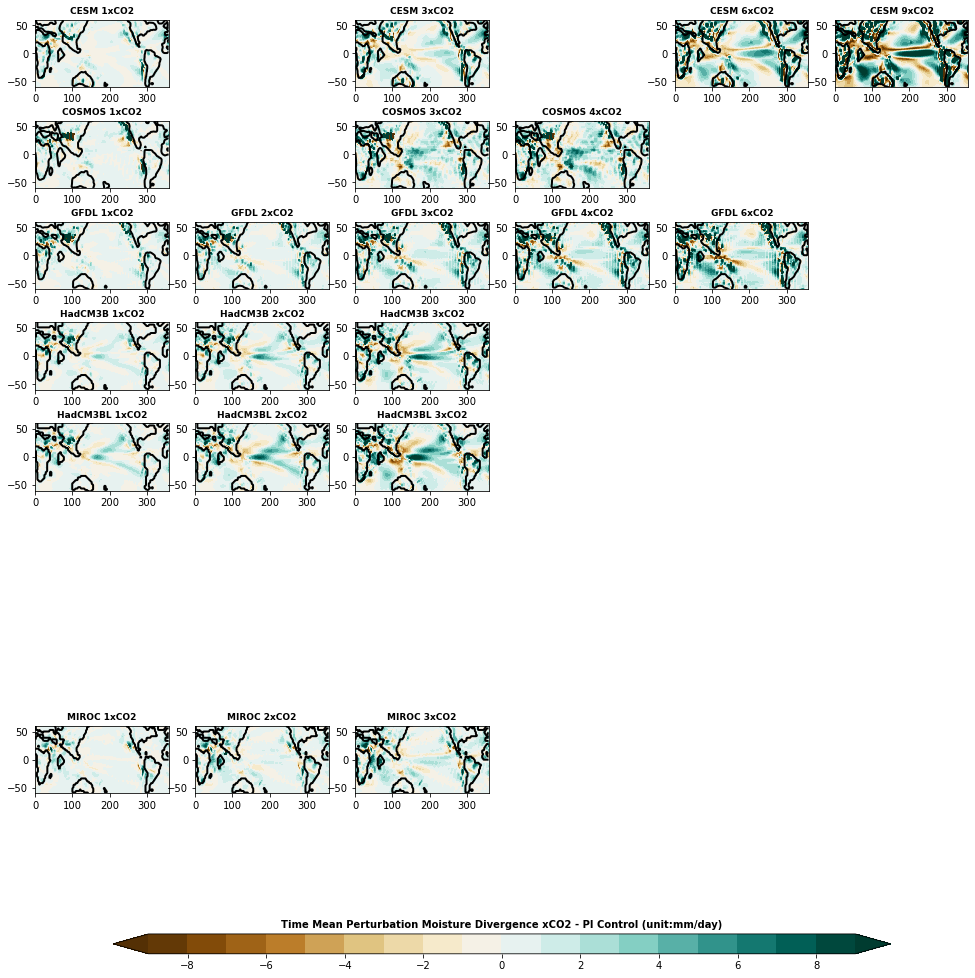

In [36]:
# Make multi panel mean pert moisture divergence plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean_pert[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
            plt.ylim([-60, 60])
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Perturbation Moisture Divergence xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_pert_ano.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_pert_ano.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

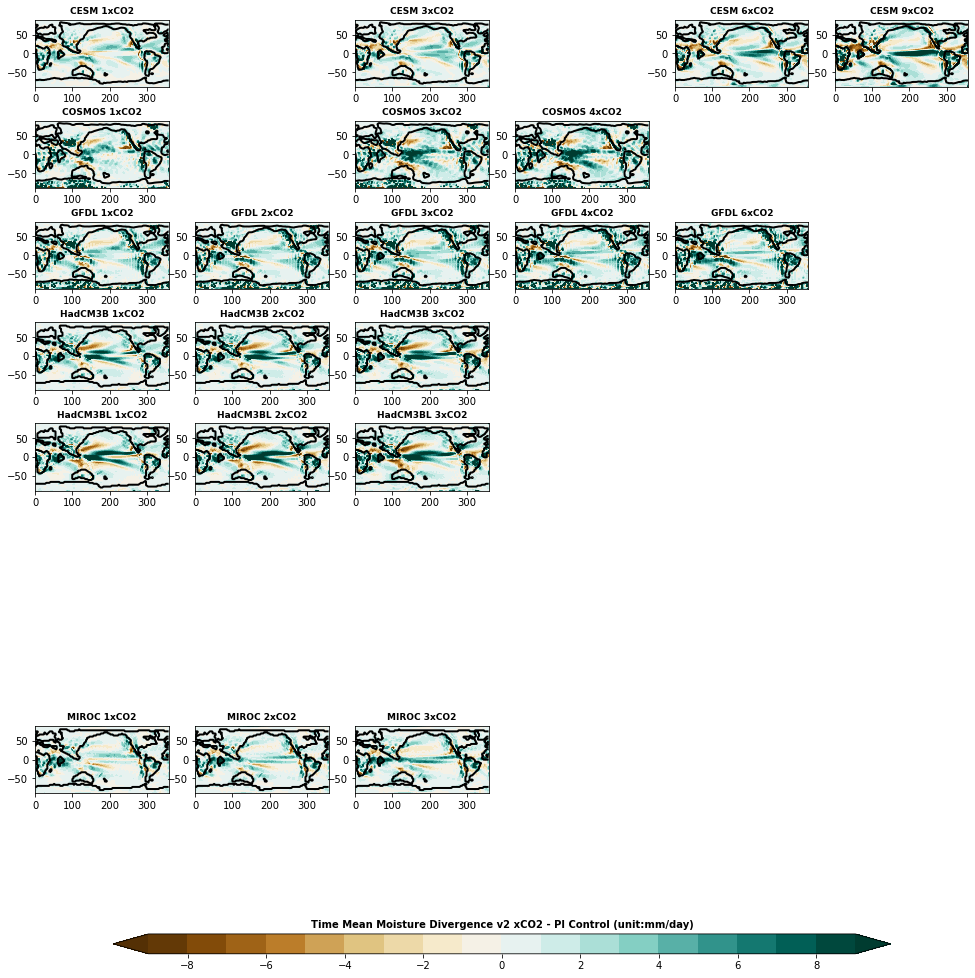

In [37]:
# Make multi panel mean moisture divergence anomaly plot derived by summing the decomp terms
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean_thermo[:,:,i,j]*86400*1000-Moisture_Div_mean_dynamic[:,:,i,j]*86400*1000-Moisture_Div_mean_pert[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Moisture Divergence v2 xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_ano_v2.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_ano_v2.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

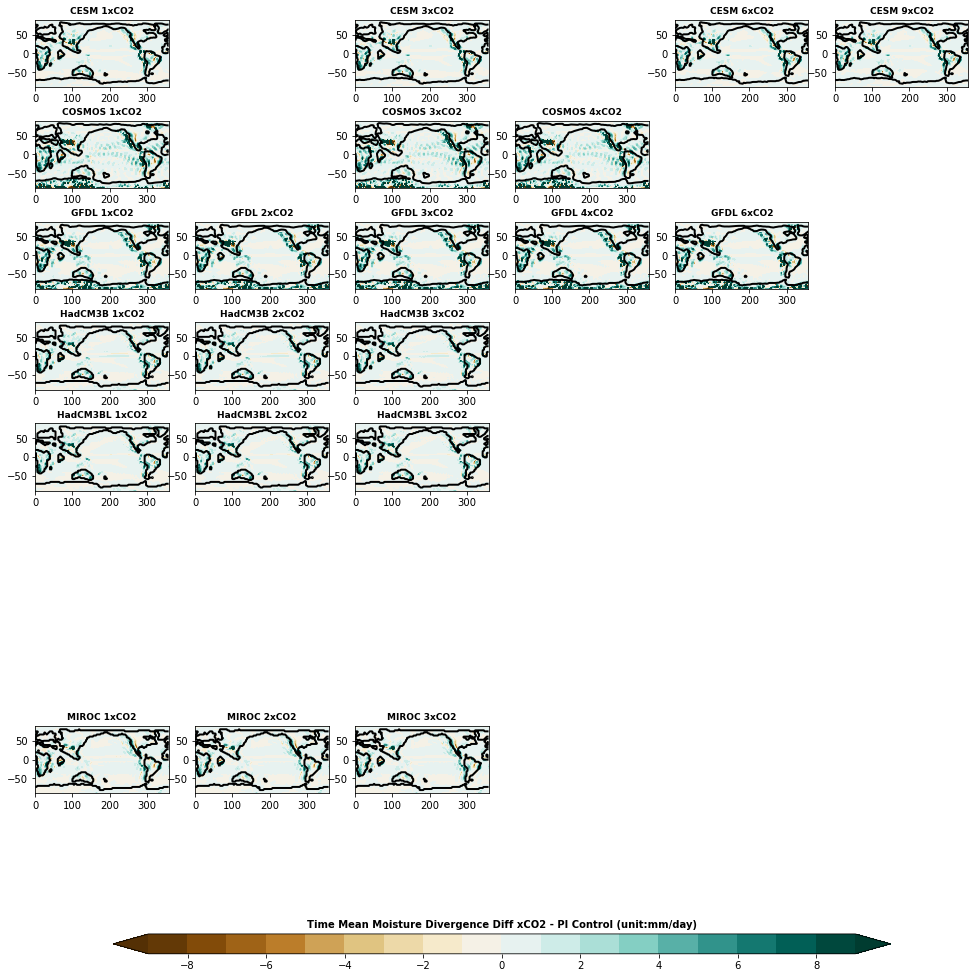

In [38]:
# Make multi panel mean moisture divergence anomaly residual plot when comparing the two methods
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lon,lat,-Moisture_Div_mean[:,:,i,j+1]*86400*1000+Moisture_Div_mean[:,:,i,0]*86400*1000+Moisture_Div_mean_thermo[:,:,i,j]*86400*1000+Moisture_Div_mean_dynamic[:,:,i,j]*86400*1000+Moisture_Div_mean_pert[:,:,i,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
            #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
            plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Time Mean Moisture Divergence Diff xCO2 - PI Control (unit:mm/day)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/Moisture_Div_mean_ano_diff.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_ano_dff.pdf', format='pdf')
proj_moisture=['piControl','1xCO2 (n=6)','2xCO2 (n=4)','3xCO2 (n=6)','4xCO2 (n=2)',\
      '6xCO2 (n=2)','9xCO2 (n=1)']

In [39]:
# Create anomalie matrix (ano from PI control)
tsanom=np.zeros((len(lat),len(lon),len(model),len(proj)-1))
for p in range(len(proj)-1):
    tsanom[:,:,:,p]=ts[:,:,:,p+1]-ts[:,:,:,0]

pranom=np.zeros((len(lat),len(lon),len(model),len(proj)-1))
for p in range(len(proj)-1):
    pranom[:,:,:,p]=pr[:,:,:,p+1]-pr[:,:,:,0]

evanom=np.zeros((len(lat),len(lon),len(model),len(proj)-1))
for p in range(len(proj)-1):
    evanom[:,:,:,p]=ev[:,:,:,p+1]-ev[:,:,:,0]

peanom=np.zeros((len(lat),len(lon),len(model),len(proj)-1))
for p in range(len(proj)-1):
    peanom[:,:,:,p]=pe[:,:,:,p+1]-pe[:,:,:,0]

Moisture_Div_meananom=np.zeros((len(lat),len(lon),len(model),len(proj)-1))
for p in range(len(proj)-1):
    Moisture_Div_meananom[:,:,:,p]=(-Moisture_Div_mean[:,:,:,p+1]+Moisture_Div_mean[:,:,:,0])*86400*1000 # in mm/day
    
Moisture_Div_eddyanom=peanom-Moisture_Div_meananom

In [40]:
## Multi model mean plot

prMMM=np.nanmean(pr[:,:,:,1:7],2)
tsMMM=np.nanmean(ts[:,:,:,1:7],2)
peMMM=np.nanmean(pe[:,:,:,1:7],2)

pranoMMM=np.nanmean(pranom,2)
tsanoMMM=np.nanmean(tsanom,2)
peanoMMM=np.nanmean(peanom,2)

Moisture_Div_meananoMMM=np.nanmean(Moisture_Div_meananom,2)
Moisture_Div_eddyanoMMM=peanoMMM-Moisture_Div_meananoMMM

Moisture_Div_mean_thermoMMM=np.nanmean(Moisture_Div_mean_thermo,2)
Moisture_Div_mean_dynamicMMM=np.nanmean(Moisture_Div_mean_dynamic,2)
Moisture_Div_mean_pertMMM=np.nanmean(Moisture_Div_mean_pert,2)

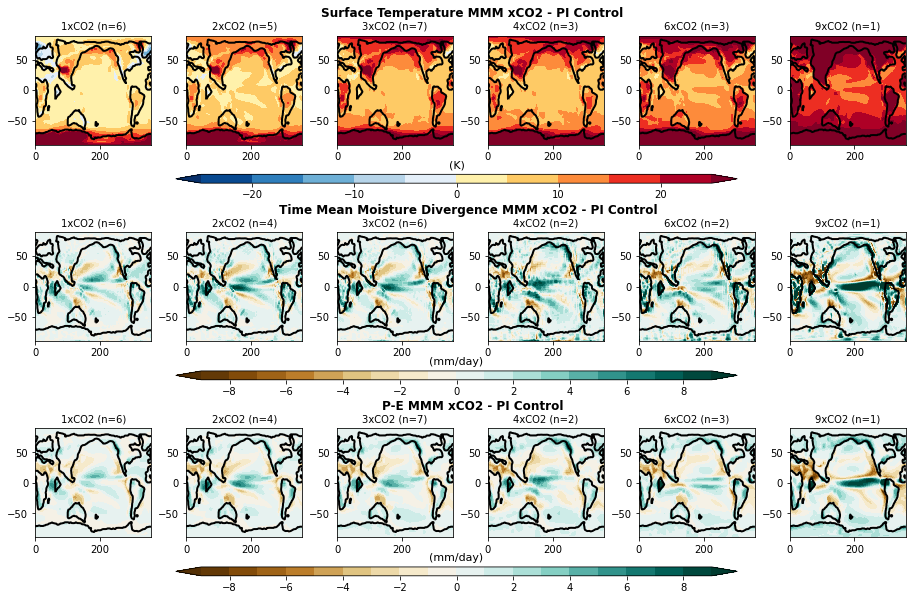

In [41]:
#anoMMM

proj_ts=['piControl','1xCO2 (n=6)','2xCO2 (n=5)','3xCO2 (n=7)','4xCO2 (n=3)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

#fig=plt.figure(figsize=(13,9))
fig=plt.figure(figsize=(13,8.2))
plt.subplots_adjust(left=.05, bottom=.1, right=.98, top=.95,hspace=.8,wspace=.3)
run=1
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,tsanoMMM[:,:,j], extend='both', cmap=ap.cmap(), levels=np.arange(-25,26,5))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_ts[j+1][:],fontsize=10)
    run=run+1

plt.text(-1450,120,s='Surface Temperature MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax1 = fig.add_axes([0.2, 0.7, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('(K)',fontsize=11)

run=7
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,Moisture_Div_meananoMMM[:,:,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_moisture[j+1][:],fontsize=10)
    run=run+1

plt.text(-1580,120,s='Time Mean Moisture Divergence MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax2 = fig.add_axes([0.2, 0.367, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax2, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

run=13
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,peanoMMM[:,:,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_pe[j+1][:],fontsize=10)
    run=run+1

plt.text(-1260,120,s='P-E MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax3 = fig.add_axes([0.2, 0.035, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax3, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

plt.savefig("./plots/MMM_moistureflux_ano.png",dpi=300)
plt.savefig('./plots/MMM_moistureflux_ano.pdf', format='pdf')

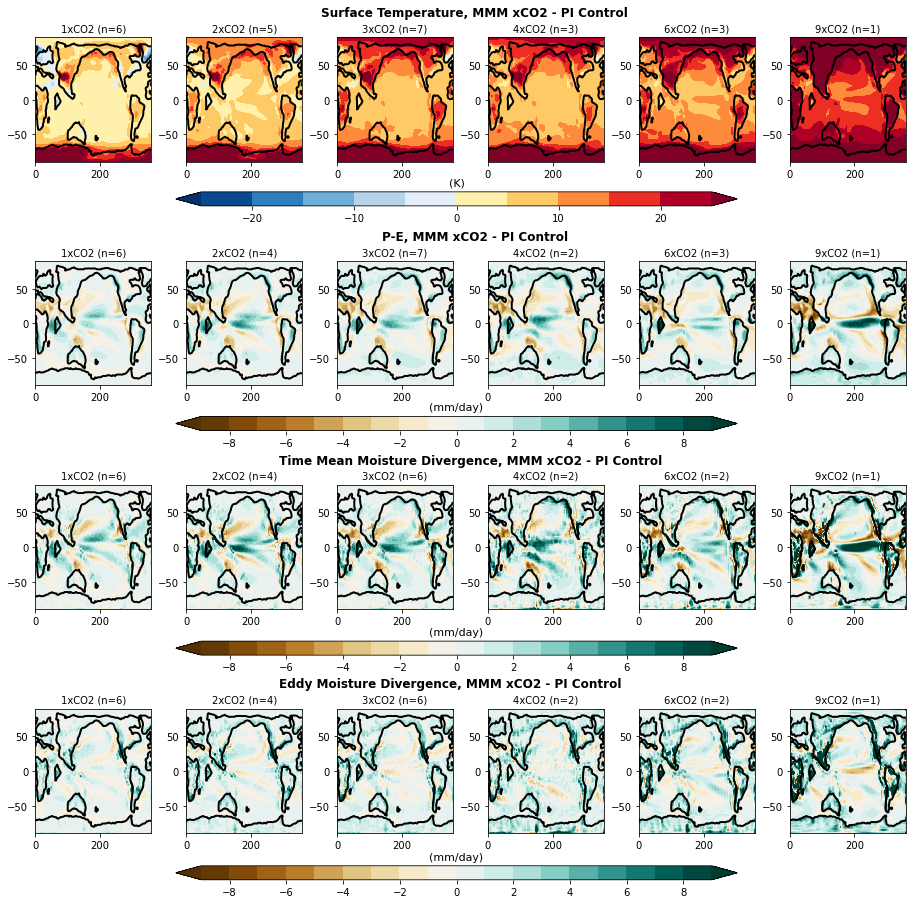

In [42]:
#anoMMM

proj_ts=['piControl','1xCO2 (n=6)','2xCO2 (n=5)','3xCO2 (n=7)','4xCO2 (n=3)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

fig=plt.figure(figsize=(13,13))
plt.subplots_adjust(left=.05, bottom=.1, right=.98, top=.95,hspace=.8,wspace=.3)
run=1
for j in range(len(proj)-1):
    plt.subplot(4,6,run)
    cs=plt.contourf(lon,lat,tsanoMMM[:,:,j], extend='both', cmap=ap.cmap(), levels=np.arange(-25,26,5))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_ts[j+1][:],fontsize=10)
    run=run+1

plt.text(-1450,120,s='Surface Temperature, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax1 = fig.add_axes([0.2, 0.77, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('(K)',fontsize=11)

run=7
for j in range(len(proj)-1):
    plt.subplot(4,6,run)
    cs=plt.contourf(lon,lat,peanoMMM[:,:,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_pe[j+1][:],fontsize=10)
    run=run+1
    
plt.text(-1260,120,s='P-E, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax2 = fig.add_axes([0.2, 0.53, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax2, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)
    
run=13
for j in range(len(proj)-1):
    plt.subplot(4,6,run)
    cs=plt.contourf(lon,lat,Moisture_Div_meananoMMM[:,:,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_moisture[j+1][:],fontsize=10)
    run=run+1


plt.text(-1580,120,s='Time Mean Moisture Divergence, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax3 = fig.add_axes([0.2, 0.29, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax3, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

    
run=19
for j in range(len(proj)-1):
    plt.subplot(4,6,run)
    cs=plt.contourf(lon,lat,Moisture_Div_eddyanoMMM[:,:,j], extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_moisture[j+1][:],fontsize=10)
    run=run+1

plt.text(-1580,120,s='Eddy Moisture Divergence, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax4 = fig.add_axes([0.2, 0.05, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax4, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

plt.savefig("./plots/FigS7new_oldFigS6_MMM_moistureflux_ano.png",dpi=300)
plt.savefig('./plots/FigS7new_oldFigS6_MMM_moistureflux_ano.pdf', format='pdf')

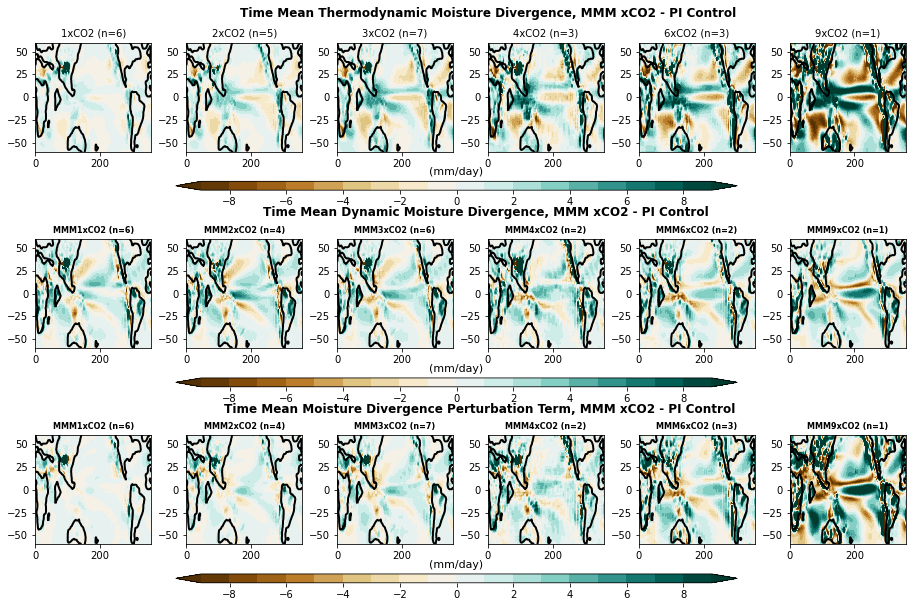

In [43]:
#anoMMM

proj_ts=['piControl','1xCO2 (n=6)','2xCO2 (n=5)','3xCO2 (n=7)','4xCO2 (n=3)',\
      '6xCO2 (n=3)','9xCO2 (n=1)']

fig=plt.figure(figsize=(13,8.2))
plt.subplots_adjust(left=.05, bottom=.1, right=.98, top=.95,hspace=.8,wspace=.3)
run=1
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,-Moisture_Div_mean_thermoMMM[:,:,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title(proj_ts[j+1][:],fontsize=10)
    plt.ylim([-60, 60])
    run=run+1
    
plt.text(-1700,88,s='Time Mean Thermodynamic Moisture Divergence, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax1 = fig.add_axes([0.2, 0.7, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

run=7
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,-Moisture_Div_mean_dynamicMMM[:,:,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title('MMM'+proj_moisture[j+1][:],fontsize=8,fontweight='bold')
    plt.ylim([-60, 60])
    run=run+1

plt.text(-1630,85,s='Time Mean Dynamic Moisture Divergence, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax2 = fig.add_axes([0.2, 0.367, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax2, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

run=13
for j in range(len(proj)-1):
    plt.subplot(3,6,run)
    cs=plt.contourf(lon,lat,-Moisture_Div_mean_pertMMM[:,:,j]*86400*1000, extend='both', cmap='BrBG', levels=np.arange(-9,10,1))
    #plt.contour(submap.lon,submap.lat,submap.sftlf[0,:,:], colors='black', linewidths=0.5)
    plt.contour(lon,lat,sftlf[:,:,0,1], levels=[0.5], colors='black', linewidths=2)
    #plt.title('MMM '+proj[j+1][-5:],fontsize=9,fontweight='bold')
    plt.title('MMM'+proj_pe[j+1][:],fontsize=8,fontweight='bold')
    plt.ylim([-60, 60])
    run=run+1

plt.text(-1750,85,s='Time Mean Moisture Divergence Perturbation Term, MMM xCO2 - PI Control',fontsize=12,fontweight='bold')

cbar_ax3 = fig.add_axes([0.2, 0.035, .6, 0.015])
plt.colorbar(cs,cax=cbar_ax3, orientation="horizontal")
plt.title('(mm/day)',fontsize=11)

plt.savefig("./plots/FigS8_MMM_moistureflux_timemean_decomp.png",dpi=300)
plt.savefig('./plots/FigS8_MMM_moistureflux_timemean_decomp.pdf', format='pdf')

**Plot Zonal Means**

In [44]:
# Create zonal means
tszonal=np.nanmean(ts,1)-273.15 #Converting from K to C
tsanozonal=np.nanmean(tsanom,1)

przonal=np.nanmean(pr,1)
pranozonal=np.nanmean(pranom,1)

evzonal=np.nanmean(ev,1)
evanozonal=np.nanmean(evanom,1)

pezonal=np.nanmean(pe,1)
peanozonal=np.nanmean(peanom,1)

Moisture_Div_meanzonal=np.nanmean(Moisture_Div_mean,1)
Moisture_Div_meananomzonal=np.nanmean(Moisture_Div_meananom,1)

Moisture_Div_mean_thermozonal = np.nanmean(Moisture_Div_mean_thermo,1)
Moisture_Div_mean_dynamiczonal = np.nanmean(Moisture_Div_mean_dynamic,1)
Moisture_Div_mean_pertzonal = np.nanmean(Moisture_Div_mean_pert,1)

Moisture_Div_eddy=pe+Moisture_Div_mean*86400*1000
Moisture_Div_eddyzonal=np.nanmean(Moisture_Div_eddy,1)
Moisture_Div_eddyanomzonal=np.nanmean(Moisture_Div_eddyanom,1)

VbarQbar_2Dzonal = np.nanmean(VbarQbar_2D,1)
VbarQbar_transportzonal = np.nanmean(VbarQbar_transport,1)
VbarQbar_divzonal = np.nanmean(VbarQbar_div,1)

VcntQanobar_2Dzonal = np.nanmean(VcntQanobar_2D,1)
VcntQanobar_transportzonal = np.nanmean(VcntQanobar_transport,1)
VcntQanobar_divzonal = np.nanmean(VcntQanobar_div,1)

VanoQcntbar_2Dzonal = np.nanmean(VanoQcntbar_2D,1)
VanoQcntbar_transportzonal = np.nanmean(VanoQcntbar_transport,1)
VanoQcntbar_divzonal = np.nanmean(VanoQcntbar_div,1)

VanoQanobar_2Dzonal = np.nanmean(VanoQanobar_2D,1)
VanoQanobar_transportzonal = np.nanmean(VanoQanobar_transport,1)
VanoQanobar_divzonal = np.nanmean(VanoQanobar_div,1)

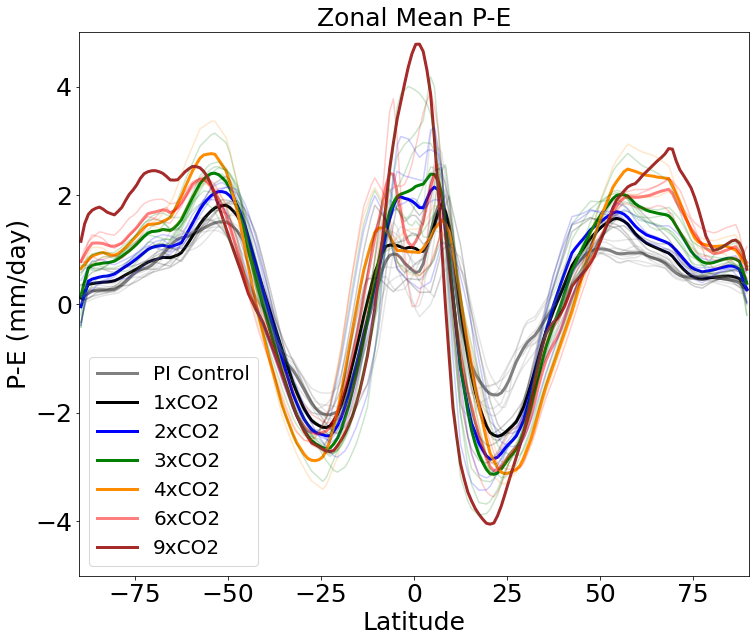

In [45]:
# Plot zonal mean P-E
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(pezonal[:,:,0],1), color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(pezonal[:,:,1],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(pezonal[:,:,2],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(pezonal[:,:,3],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(pezonal[:,:,4],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(pezonal[:,:,5],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(pezonal[:,:,6],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal Mean P-E', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('P-E (mm/day)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-5, 5])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,pezonal[:,i,0], color='gray', label='PI', alpha=.2);
    plt.plot(lat,pezonal[:,i,1], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,pezonal[:,i,2], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,pezonal[:,i,3], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,pezonal[:,i,4], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,pezonal[:,i,5], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,pezonal[:,i,6], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8a_pezonal.png',dpi=300)
plt.savefig('./plots/Fig8a_pezonal.pdf', format='pdf')

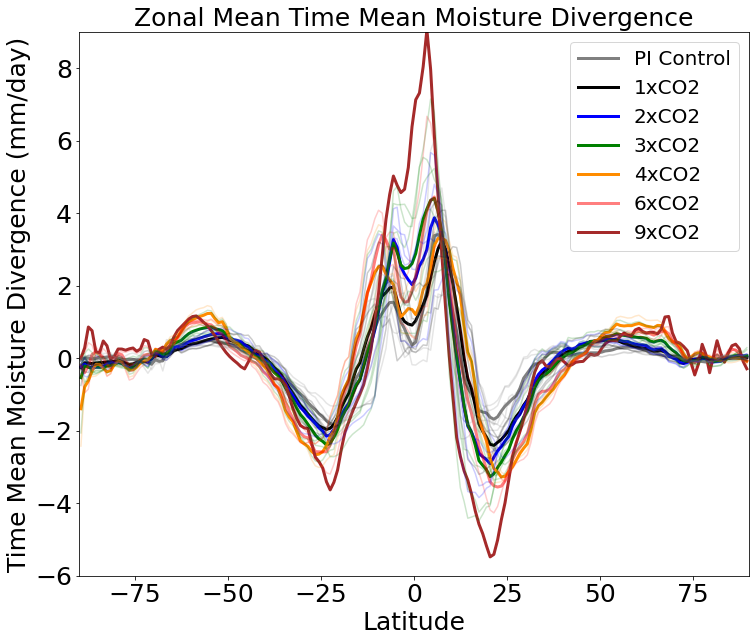

In [46]:
# Plot zonal mean Time Mean Moisture Divergence
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,0],1)*86400*1000, color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,1],1)*86400*1000, color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,2],1)*86400*1000, color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,3],1)*86400*1000, color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,4],1)*86400*1000, color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,5],1)*86400*1000, color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_meanzonal[:,:,6],1)*86400*1000, color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal Mean Time Mean Moisture Divergence', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('Time Mean Moisture Divergence (mm/day)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 9])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,0]*86400*1000, color='gray', label='PI', alpha=.2);
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,1]*86400*1000, color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,2]*86400*1000, color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,3]*86400*1000, color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,4]*86400*1000, color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,5]*86400*1000, color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_meanzonal[:,i,6]*86400*1000, color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Moisture_Div_meanzonal.png',dpi=300)
plt.savefig('./plots/Moisture_Div_meanzonal.pdf', format='pdf')

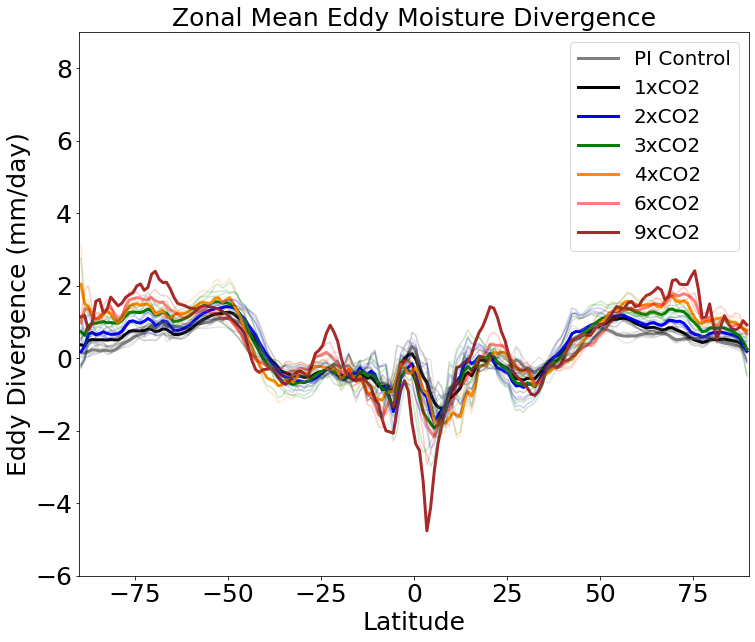

In [47]:
# Plot zonal mean Eddy Moisture Divergence
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,0],1), color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,1],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,2],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,3],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,4],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,5],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(Moisture_Div_eddyzonal[:,:,6],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal Mean Eddy Moisture Divergence', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('Eddy Divergence (mm/day)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 9])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,0], color='gray', label='PI', alpha=.2);
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,1], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,2], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,3], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,4], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,5], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,Moisture_Div_eddyzonal[:,i,6], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Moisture_Div_eddyzonal.png',dpi=300)
plt.savefig('./plots/Moisture_Div_eddyzonal.pdf', format='pdf')

In [48]:
# Estimate transport from E-P
rho_fw=1000.0

# Zonal mean Area
Azonal=np.mean(A, axis=1)

#Get weights for averaging
Gal = np.deg2rad(lat); Gweight = np.cos(Gal)
#Global mean P-E
Gpe=np.average(pezonal, axis=0, weights=Gweight)
#Global mean area
GA=np.average(Azonal, axis=0, weights=Gweight)

EmP_ZM=np.zeros([nlat, len(mdir), len(proj)])
for i in range(len(mdir)):
    for j in range(len(proj)):
        EmP_ZM[:,i,j]=-pezonal[:,i,j]/86400+(Gpe[i,j]/86400/GA*Azonal) #mm/day to kg/m^2/s

dy_ZM=np.mean(dy, axis=1) # meters
dx_ZM=np.mean(dx, axis=1) # meters

VQbar_transport_ZM_implied_v1=np.zeros([nlat, len(mdir), len(proj)])
for i in range(len(mdir)):
    for j in range(len(proj)):
         VQbar_transport_ZM_implied_v1[:,i,j]=EmP_ZM[:,i,j]*dx_ZM*dy_ZM # kg/s (kg/m^2/s * m * m)
            
VQbar_transport_ZM_implied = np.zeros([nlat+1, len(mdir), len(proj)])
for k in range(nlat):
    if k==0:
        VQbar_transport_ZM_implied[k+1]=VQbar_transport_ZM_implied_v1[0]/rho_fw+0 #kg/s / kg/m^3 -> m^3/s
    else:
         VQbar_transport_ZM_implied[k+1]=sum(VQbar_transport_ZM_implied_v1[0:k+1])/rho_fw+0 #kg/s / kg/m^3 -> m^3/s
            
g = 9.81 # gravitational constant 

dp_naned_int=np.nansum(dp_naned,0)
p_naned_int_ZM=np.nanmean(dp_naned_int, axis=1);

dx_midy_ZM = np.mean(dx_midy, axis=1) # meters
p_naned_int_ZM_mid = (p_naned_int_ZM[0:-1,:,:]+p_naned_int_ZM[1:,:,:])/2;
VQbar_2D_ZM_implied = np.zeros([nlat+1, len(mdir), len(proj)])

for i in range(len(mdir)):
    for j in range(len(proj)):
        VQbar_2D_ZM_implied[1:-1,i,j]=VQbar_transport_ZM_implied[1:-1,i,j]*rho_fw/dx_midy_ZM*g/p_naned_int_ZM_mid[:,i,j]*1000
VQbar_2D_ZM_implied_mid = (VQbar_2D_ZM_implied[1:,:,:]+VQbar_2D_ZM_implied[0:-1,:,:])/2

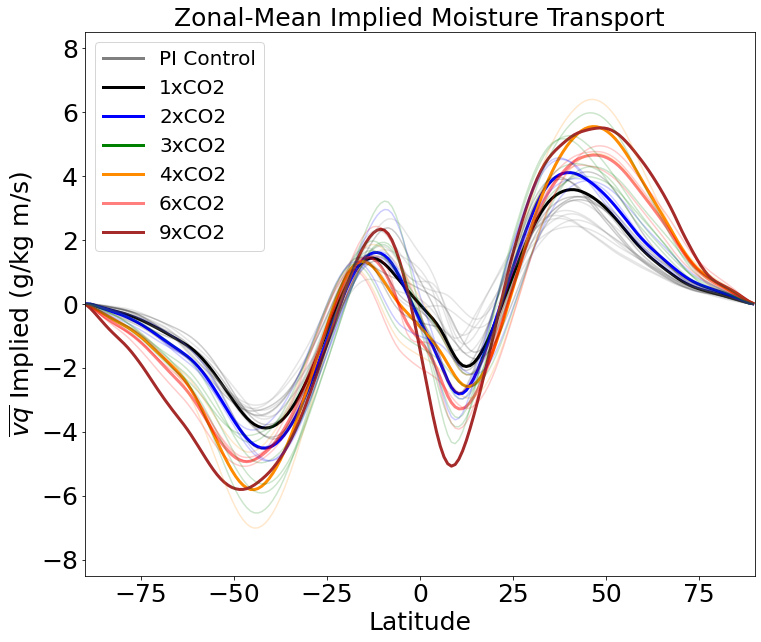

In [49]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,0],1), color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,1],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,2],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,3],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,4],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,5],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,6],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Implied Moisture Transport', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{vq}$ Implied (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-8.5, 8.5])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,0], color='gray', label='PI', alpha=.2);
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,1], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,2], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,3], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,4], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,5], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,6], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8b_VQbar_implied_2Dzonal.png',dpi=300)
plt.savefig('./plots/Fig8b_VQbar_implied_2Dzonal.pdf', format='pdf')

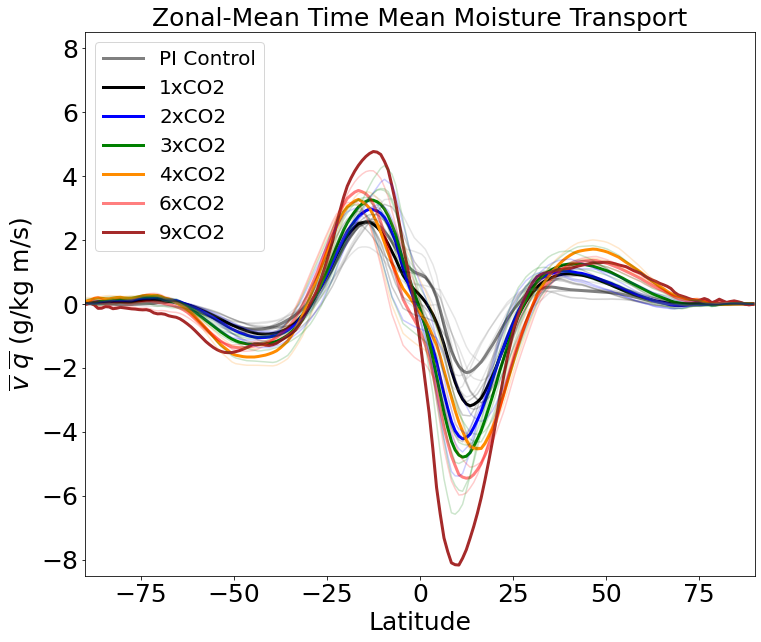

In [50]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,1],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,2],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,3],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,4],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,5],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,6],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Moisture Transport', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{v}$ $\overline{q}$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-8.5, 8.5])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VbarQbar_2Dzonal[:,i,0], color='gray', label='PI', alpha=.2);
    plt.plot(lat,VbarQbar_2Dzonal[:,i,1], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VbarQbar_2Dzonal[:,i,2], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,3], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,4], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,5], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,6], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8c_.png',dpi=300)
plt.savefig('./plots/Fig8c_VbarQbar_2Dzonal.pdf', format='pdf')

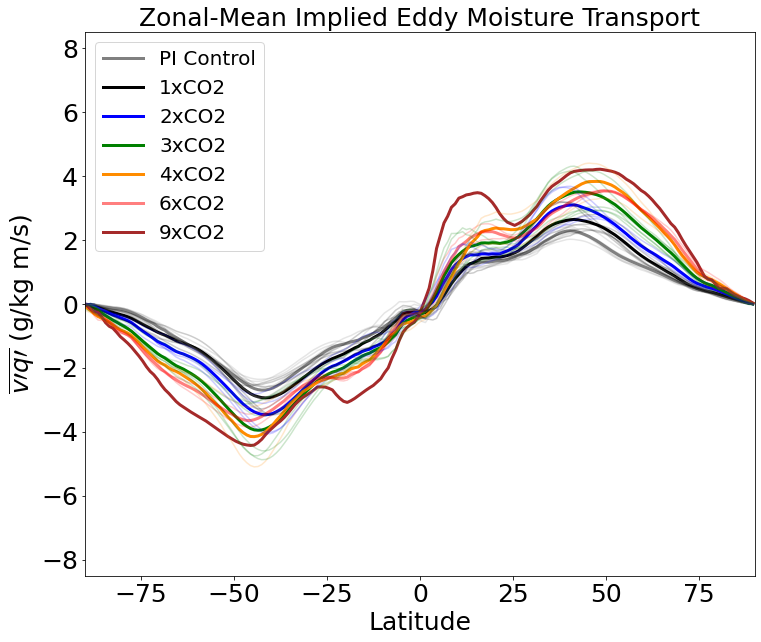

In [51]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,0]-VbarQbar_2Dzonal[:,:,0],1), color='gray', label='PI Control',linewidth=3.0);
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,1]-VbarQbar_2Dzonal[:,:,1],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,2]-VbarQbar_2Dzonal[:,:,2],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,3]-VbarQbar_2Dzonal[:,:,3],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,4]-VbarQbar_2Dzonal[:,:,4],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,5]-VbarQbar_2Dzonal[:,:,5],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VQbar_2D_ZM_implied_mid[:,:,6]-VbarQbar_2Dzonal[:,:,6],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Implied Eddy Moisture Transport', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{ v \prime q \prime }$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-8.5, 8.5])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,0]-VbarQbar_2Dzonal[:,i,0], color='gray', label='PI', alpha=.2);
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,1]-VbarQbar_2Dzonal[:,i,1], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,2]-VbarQbar_2Dzonal[:,i,2], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,3]-VbarQbar_2Dzonal[:,i,3], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,4]-VbarQbar_2Dzonal[:,i,4], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,5]-VbarQbar_2Dzonal[:,i,5], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VQbar_2D_ZM_implied_mid[:,i,6]-VbarQbar_2Dzonal[:,i,6], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8d_VpertQpert_2Dzonal.png',dpi=300)
plt.savefig('./plots/Fig8d_VpertQbarpert_2Dzonal.pdf', format='pdf')

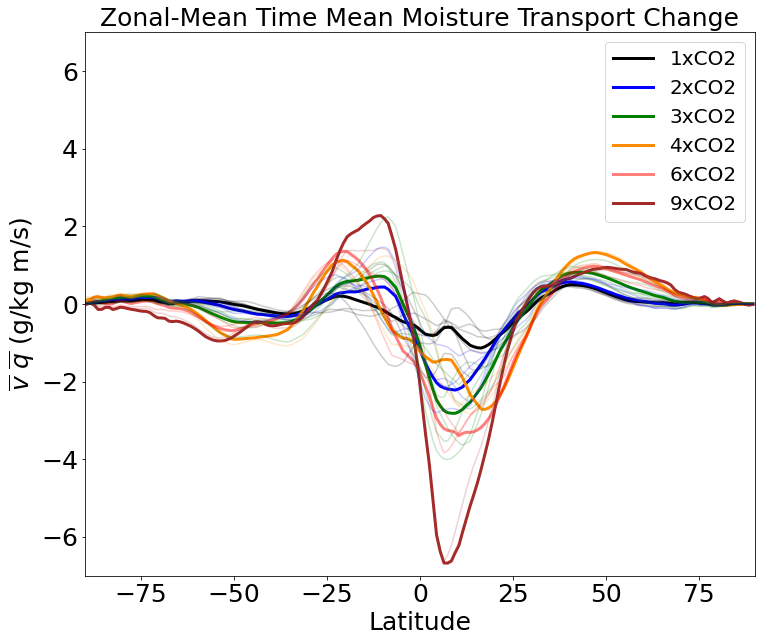

In [52]:
# Plot zonal mean Moisture Transport change
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,1],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,2],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,3],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,4],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,5],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VbarQbar_2Dzonal[:,:,6],1)-np.nanmean(VbarQbar_2Dzonal[:,:,0],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Moisture Transport Change', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{v}$ $\overline{q}$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-7, 7])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VbarQbar_2Dzonal[:,i,1]-VbarQbar_2Dzonal[:,i,0], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VbarQbar_2Dzonal[:,i,2]-VbarQbar_2Dzonal[:,i,0], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,3]-VbarQbar_2Dzonal[:,i,0], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,4]-VbarQbar_2Dzonal[:,i,0], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,5]-VbarQbar_2Dzonal[:,i,0], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VbarQbar_2Dzonal[:,i,6]-VbarQbar_2Dzonal[:,i,0], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/VbarQbar_2Dzonal_ano.png',dpi=300)
plt.savefig('./plots/VbarQbar_2Dzonal_ano.pdf', format='pdf')

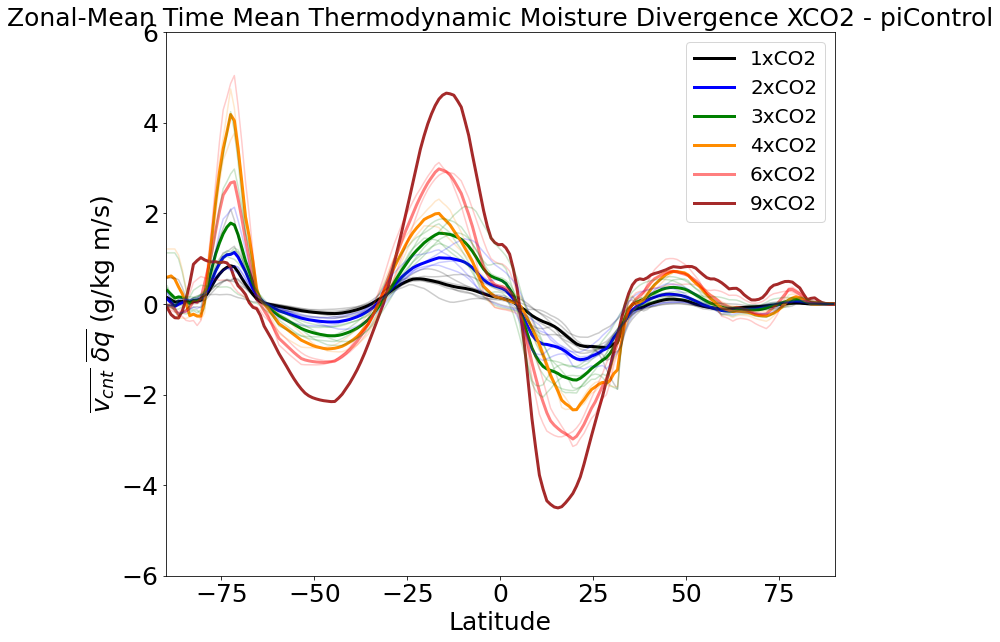

In [53]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,0],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,1],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,2],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,3],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,4],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VcntQanobar_2Dzonal[:,:,5],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Thermodynamic Moisture Divergence XCO2 - piControl', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{v_{cnt}}$ $\overline{\delta q}$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,0], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,1], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,2], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,3], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,4], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VcntQanobar_2Dzonal[:,i,5], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8e_VcntQanobar_2Dzonal.png',dpi=300)
plt.savefig('./plots/Fig8e_VcntQanobar_2Dzonal.pdf', format='pdf')

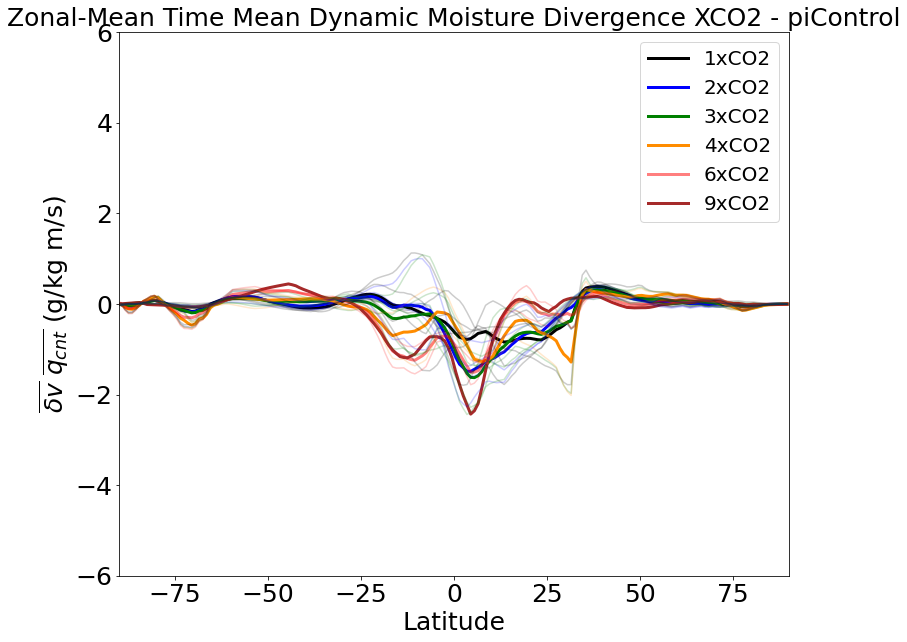

In [54]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,0],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,1],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,2],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,3],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,4],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQcntbar_2Dzonal[:,:,5],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Dynamic Moisture Divergence XCO2 - piControl', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{\delta v}$ $\overline{q_{cnt}}$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,0], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,1], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,2], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,3], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,4], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VanoQcntbar_2Dzonal[:,i,5], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Fig8f_VanoQcntbar_2Dzonal.png',dpi=300)
plt.savefig('./plots/Fig8f_VanoQcntbar_2Dzonal.pdf', format='pdf')

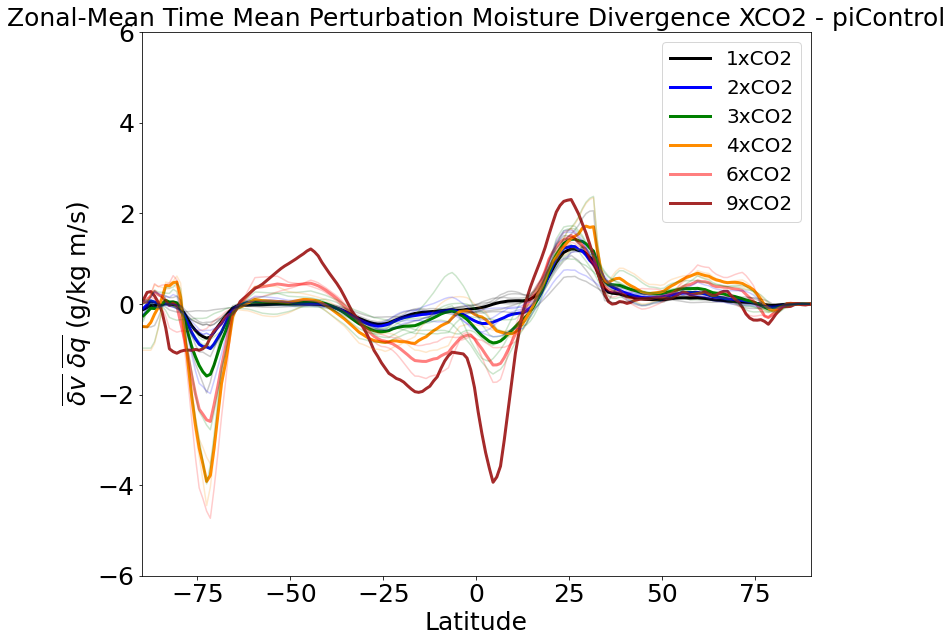

In [55]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,0],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,1],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,2],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,3],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,4],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(VanoQanobar_2Dzonal[:,:,5],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Perturbation Moisture Divergence XCO2 - piControl', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('$\overline{\delta v}$ $\overline{\delta q}$ (g/kg m/s)', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,0], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,1], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,2], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,3], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,4], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,VanoQanobar_2Dzonal[:,i,5], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/VanoQanobar_2Dzonal.png',dpi=300)
plt.savefig('./plots/VanoQanobar_2Dzonal.pdf', format='pdf')

In [56]:
Res = np.zeros([nlat,mod,exp-1])
for i in range(len(proj)-1):
    Res[:,:,i]=(VbarQbar_2Dzonal[:,:,i+1]-VbarQbar_2Dzonal[:,:,0])-(VanoQcntbar_2Dzonal[:,:,i]+VcntQanobar_2Dzonal[:,:,i]+VanoQanobar_2Dzonal[:,:,i])
    #Res[:,:,i]=(VbarQbar_2Dzonal[:,:,i+1]-VbarQbar_2Dzonal[:,:,0])
#Res=(VanoQcntbar_2Dzonal+VcntQanobar_2Dzonal+VanoQanobar_2Dzonal)

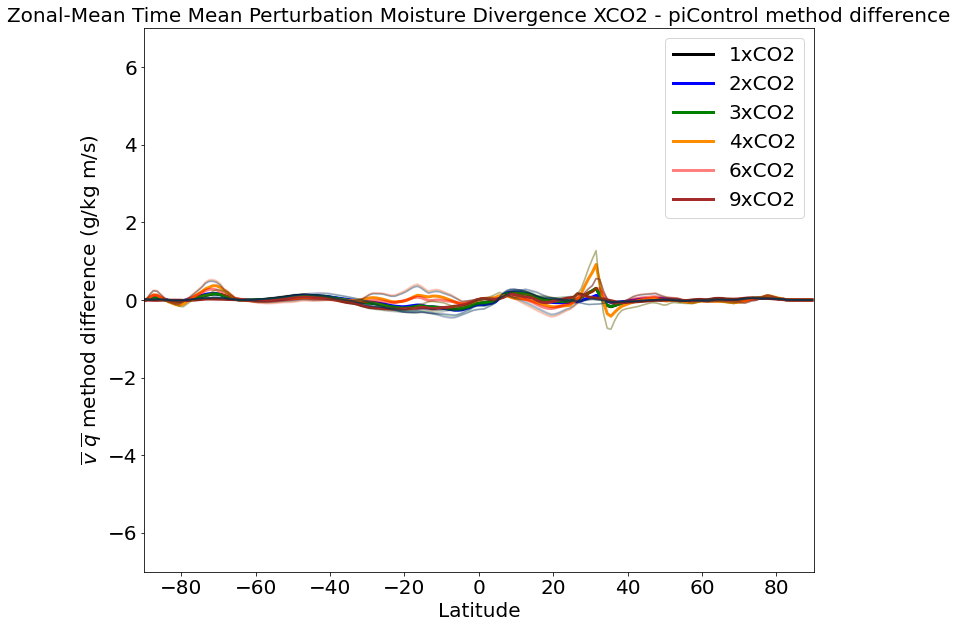

In [57]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(Res[:,:,0],1), color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(Res[:,:,1],1), color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Res[:,:,2],1), color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Res[:,:,3],1), color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(Res[:,:,4],1), color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(Res[:,:,5],1), color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('Zonal-Mean Time Mean Perturbation Moisture Divergence XCO2 - piControl method difference', fontsize=20)
plt.xlabel('Latitude', fontsize=20)
plt.ylabel('$\overline{v}$ $\overline{q}$ method difference (g/kg m/s)', fontsize=20)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-7, 7])
plt.tick_params(labelsize=20)


for i in range(len(model)):
    plt.plot(lat,Res[:,i,0], color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,Res[:,i,1], color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,Res[:,i,2], color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,Res[:,i,3], color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,Res[:,i,4], color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,Res[:,i,5], color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Res.png',dpi=300)
plt.savefig('./plots/Res.pdf', format='pdf')

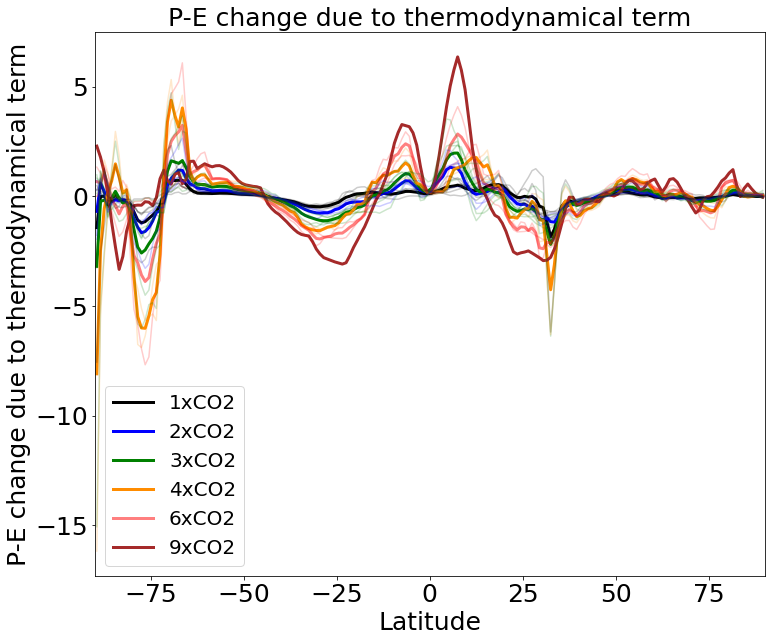

In [58]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,0],1)*86400*1000, color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,1],1)*86400*1000, color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,2],1)*86400*1000, color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,3],1)*86400*1000, color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,4],1)*86400*1000, color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_thermozonal[:,:,5],1)*86400*1000, color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('P-E change due to thermodynamical term', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('P-E change due to thermodynamical term', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
#plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,0]*86400*1000, color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,1]*86400*1000, color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,2]*86400*1000, color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,3]*86400*1000, color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,4]*86400*1000, color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_thermozonal[:,i,5]*86400*1000, color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Moisture_Div_mean_thermozonal.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_thermozonal.pdf', format='pdf')

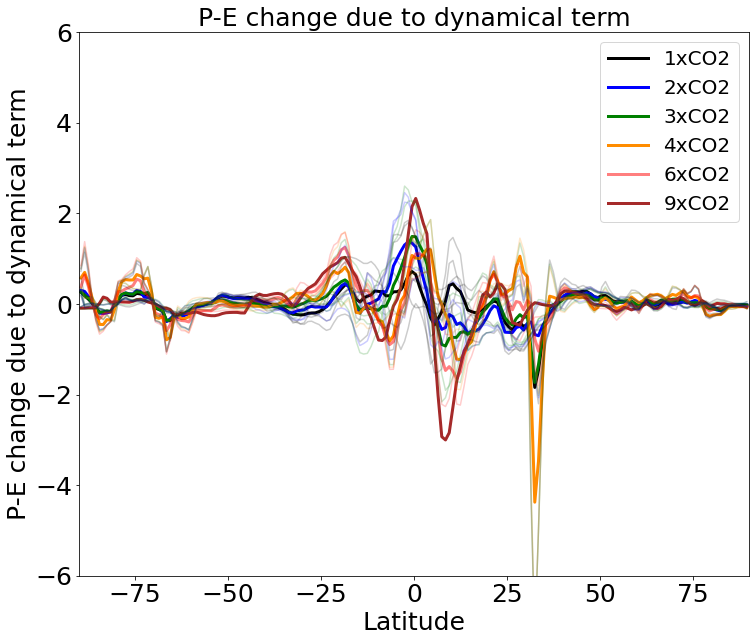

In [59]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,0],1)*86400*1000, color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,1],1)*86400*1000, color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,2],1)*86400*1000, color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,3],1)*86400*1000, color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,4],1)*86400*1000, color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_dynamiczonal[:,:,5],1)*86400*1000, color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('P-E change due to dynamical term', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('P-E change due to dynamical term', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,0]*86400*1000, color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,1]*86400*1000, color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,2]*86400*1000, color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,3]*86400*1000, color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,4]*86400*1000, color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_dynamiczonal[:,i,5]*86400*1000, color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Moisture_Div_mean_dynamiczonal.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_dynamiczonal.pdf', format='pdf')

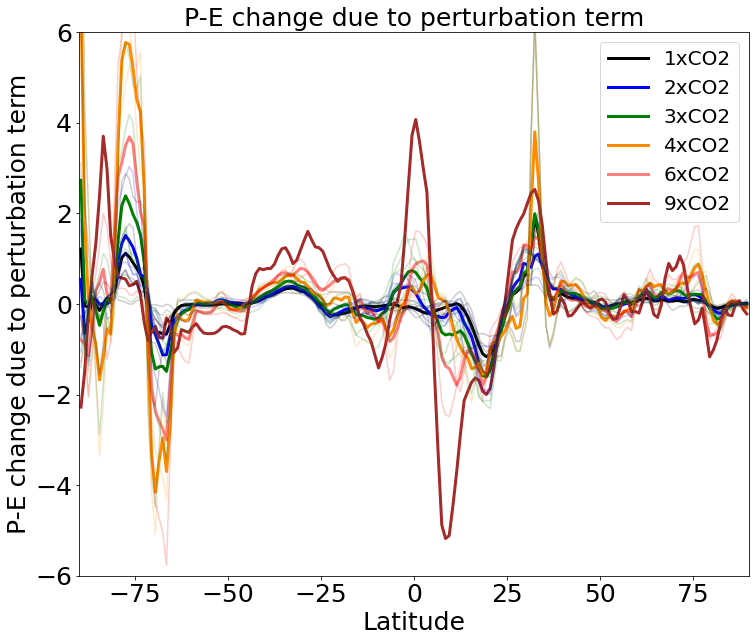

In [60]:
# Plot zonal mean Moisture Transport
plt.figure(figsize=(12,10))

plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,0],1)*86400*1000, color='black', label='1xCO2',linewidth=3.0);
plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,1],1)*86400*1000, color='blue', label='2xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,2],1)*86400*1000, color='green', label='3xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,3],1)*86400*1000, color='darkorange',label='4xCO2',linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,4],1)*86400*1000, color='red',label='6xCO2', alpha=.5,linewidth=3.0)
plt.plot(lat,np.nanmean(-Moisture_Div_mean_pertzonal[:,:,5],1)*86400*1000, color='brown', label='9xCO2',linewidth=3.0)
    
plt.title('P-E change due to perturbation term', fontsize=25)
plt.xlabel('Latitude', fontsize=25)
plt.ylabel('P-E change due to perturbation term', fontsize=25)
#plt.legend(proj_name[1:])
plt.legend(fontsize=20)
plt.xlim([-90, 90])
plt.ylim([-6, 6])
plt.tick_params(labelsize=25)


for i in range(len(model)):
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,0]*86400*1000, color='black', label='1xCO2', alpha=.2);
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,1]*86400*1000, color='blue', label='2xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,2]*86400*1000, color='green', label='3xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,3]*86400*1000, color='darkorange',label='4xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,4]*86400*1000, color='red',label='6xCO2', alpha=.2)
    plt.plot(lat,-Moisture_Div_mean_pertzonal[:,i,5]*86400*1000, color='brown', label='9xCO2', alpha=.2)
    
#plt.savefig('./plots/Moisture_Div_mean_pertzonal.png',dpi=300)
plt.savefig('./plots/Moisture_Div_mean_pertzonal.pdf', format='pdf')

In [61]:
# get global mean surface temperature
#Gal = np.deg2rad(lat); Gweight = np.cos(Gal)
#gst=np.average(tsanozonal, axis=0, weights=Gweight)

In [62]:
#Get weights for averaging

Tlat=np.nonzero((lat>=-15)&(lat<=15))[0]
STlat=np.nonzero((lat>=-30)&(lat<=-15))[0]
NTlat=np.nonzero((lat>=15)&(lat<=30))[0]
STlatv2=np.nonzero((lat>=-30)&(lat<=-15))[0]
NTlatv2=np.nonzero((lat>=20)&(lat<=30))[0]

SMlat=np.nonzero((lat>=-60)&(lat<=-30))[0]
NMlat=np.nonzero((lat>=30)&(lat<=60))[0]

SPlat=np.nonzero((lat>=-90)&(lat<=-60))[0]
NPlat=np.nonzero((lat>=60)&(lat<=90))[0]

Tal = np.deg2rad(lat[Tlat]); Tweight = np.cos(Tal)
STal = np.deg2rad(lat[STlat]); STweight = np.cos(STal)
NTal = np.deg2rad(lat[NTlat]); NTweight = np.cos(NTal)
STalv2 = np.deg2rad(lat[STlatv2]); STv2weight = np.cos(STalv2)
NTalv2 = np.deg2rad(lat[NTlatv2]); NTv2weight = np.cos(NTalv2)

SMal = np.deg2rad(lat[SMlat]); SMweight = np.cos(SMal)
NMal = np.deg2rad(lat[NMlat]); NMweight = np.cos(NMal)

SPal = np.deg2rad(lat[SPlat]); SPweight = np.cos(SPal)
NPal = np.deg2rad(lat[NPlat]); NPweight = np.cos(NPal)

Gal = np.deg2rad(lat); Gweight = np.cos(Gal)

In [63]:
#TS
GTs=np.average(tsanozonal, axis=0, weights=Gweight)

Tts=np.ma.average(tsanozonal[Tlat,:,:], axis=0, weights=Tweight)
Stsanom=np.ma.average(tsanozonal[STlat,:,:], axis=0, weights=STweight)
Ntsanom=np.ma.average(tsanozonal[NTlat,:,:], axis=0, weights=NTweight)
Stsanomv2=np.ma.average(tsanozonal[STlatv2,:,:], axis=0, weights=STv2weight)
Ntsanomv2=np.ma.average(tsanozonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMtsanom=np.ma.average(tsanozonal[SMlat,:,:], axis=0, weights=SMweight)
NMtsanom=np.ma.average(tsanozonal[NMlat,:,:], axis=0, weights=NMweight)

SPtsanom=np.ma.average(tsanozonal[SPlat,:,:], axis=0, weights=SPweight)
NPtsanom=np.ma.average(tsanozonal[NPlat,:,:], axis=0, weights=NPweight)

subts=(Stsanom+Ntsanom)/2
subtsv2=(Stsanomv2+Ntsanomv2)/2
Mts=(SMtsanom+NMtsanom)/2
Pts=(SPtsanom+NPtsanom)/2

# Get abs (rather than ano) global mean precip 
Gts_abs=np.average(tszonal, axis=0, weights=Gweight)

In [64]:
#PE
Gpe=np.average(peanozonal, axis=0, weights=Gweight)

Tpe=np.ma.average(peanozonal[Tlat,:,:], axis=0, weights=Tweight)
Speanom=np.ma.average(peanozonal[STlat,:,:], axis=0, weights=STweight)
Npeanom=np.ma.average(peanozonal[NTlat,:,:], axis=0, weights=NTweight)
Speanomv2=np.ma.average(peanozonal[STlatv2,:,:], axis=0, weights=STv2weight)
Npeanomv2=np.ma.average(peanozonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMpeanom=np.ma.average(peanozonal[SMlat,:,:], axis=0, weights=SMweight)
NMpeanom=np.ma.average(peanozonal[NMlat,:,:], axis=0, weights=NMweight)

SPpeanom=np.ma.average(peanozonal[SPlat,:,:], axis=0, weights=SPweight)
NPpeanom=np.ma.average(peanozonal[NPlat,:,:], axis=0, weights=NPweight)

subpe=(Speanom+Npeanom)/2
subpev2=(Speanomv2+Npeanomv2)/2
Mpe=(SMpeanom+NMpeanom)/2
Ppe=(SPpeanom+NPpeanom)/2

In [65]:
#Precip
Gpr=np.average(pranozonal, axis=0, weights=Gweight)

Tpr=np.ma.average(pranozonal[Tlat,:,:], axis=0, weights=Tweight)
Spranom=np.ma.average(pranozonal[STlat,:,:], axis=0, weights=STweight)
Npranom=np.ma.average(pranozonal[NTlat,:,:], axis=0, weights=NTweight)
Spranomv2=np.ma.average(pranozonal[STlatv2,:,:], axis=0, weights=STv2weight)
Npranomv2=np.ma.average(pranozonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMpranom=np.ma.average(pranozonal[SMlat,:,:], axis=0, weights=SMweight)
NMpranom=np.ma.average(pranozonal[NMlat,:,:], axis=0, weights=NMweight)

SPpranom=np.ma.average(pranozonal[SPlat,:,:], axis=0, weights=SPweight)
NPpranom=np.ma.average(pranozonal[NPlat,:,:], axis=0, weights=NPweight)

subpr=(Spranom+Npranom)/2
subprv2=(Spranomv2+Npranomv2)/2
Mpr=(SMpranom+NMpranom)/2
Ppr=(SPpranom+NPpranom)/2

In [66]:
#evap
Gev=np.average(evanozonal, axis=0, weights=Gweight)

Tev=np.ma.average(evanozonal[Tlat,:,:], axis=0, weights=Tweight)
Sevanom=np.ma.average(evanozonal[STlat,:,:], axis=0, weights=STweight)
Nevanom=np.ma.average(evanozonal[NTlat,:,:], axis=0, weights=NTweight)
Sevanomv2=np.ma.average(evanozonal[STlatv2,:,:], axis=0, weights=STv2weight)
Nevanomv2=np.ma.average(evanozonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMevanom=np.ma.average(evanozonal[SMlat,:,:], axis=0, weights=SMweight)
NMevanom=np.ma.average(evanozonal[NMlat,:,:], axis=0, weights=NMweight)

SPevanom=np.ma.average(evanozonal[SPlat,:,:], axis=0, weights=SPweight)
NPevanom=np.ma.average(evanozonal[NPlat,:,:], axis=0, weights=NPweight)

subev=(Sevanom+Nevanom)/2
subevv2=(Sevanomv2+Nevanomv2)/2
Mev=(SMevanom+NMevanom)/2
Pev=(SPevanom+NPevanom)/2

In [67]:
Meri_grad=Tts-Mts
Meri_gradv2=Tts-subts
gst=GTs
Meri_grad_South=Tts-SMtsanom
Meri_gradv2_South=Tts-Stsanom
Meri_grad_North=Tts-NMtsanom
Meri_gradv2_North=Tts-Ntsanom

In [68]:
#Moisture_Div_mean_ano
GMoisture_Div_meananomzonalanom=np.average(Moisture_Div_meananomzonal, axis=0, weights=Gweight)

TMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[Tlat,:,:], axis=0, weights=Tweight)
SMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[STlat,:,:], axis=0, weights=STweight)
NMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[NTlat,:,:], axis=0, weights=NTweight)
SMoisture_Div_meananomzonalanomv2=np.ma.average(Moisture_Div_meananomzonal[STlatv2,:,:], axis=0, weights=STv2weight)
NMoisture_Div_meananomzonalanomv2=np.ma.average(Moisture_Div_meananomzonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[SMlat,:,:], axis=0, weights=SMweight)
NMMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[NMlat,:,:], axis=0, weights=NMweight)

SPMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[SPlat,:,:], axis=0, weights=SPweight)
NPMoisture_Div_meananomzonalanom=np.ma.average(Moisture_Div_meananomzonal[NPlat,:,:], axis=0, weights=NPweight)

#both hemispheres
subMoisture_Div_meananomzonalanom=(SMoisture_Div_meananomzonalanom+NMoisture_Div_meananomzonalanom)/2
subMoisture_Div_meananomzonalanom2=(SMoisture_Div_meananomzonalanomv2+NMoisture_Div_meananomzonalanomv2)/2
MMoisture_Div_meananomzonalanom=(SMMoisture_Div_meananomzonalanom+NMMoisture_Div_meananomzonalanom)/2
PMoisture_Div_meananomzonalanom=(SPMoisture_Div_meananomzonalanom+NPMoisture_Div_meananomzonalanom)/2

In [69]:
#Moisture_Div_eddyanomzonal
GMoisture_Div_eddyanomzonalanom=np.average(Moisture_Div_eddyanomzonal, axis=0, weights=Gweight)

TMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[Tlat,:,:], axis=0, weights=Tweight)
SMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[STlat,:,:], axis=0, weights=STweight)
NMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[NTlat,:,:], axis=0, weights=NTweight)
SMoisture_Div_eddyanomzonalanomv2=np.ma.average(Moisture_Div_eddyanomzonal[STlatv2,:,:], axis=0, weights=STv2weight)
NMoisture_Div_eddyanomzonalanomv2=np.ma.average(Moisture_Div_eddyanomzonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[SMlat,:,:], axis=0, weights=SMweight)
NMMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[NMlat,:,:], axis=0, weights=NMweight)

SPMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[SPlat,:,:], axis=0, weights=SPweight)
NPMoisture_Div_eddyanomzonalanom=np.ma.average(Moisture_Div_eddyanomzonal[NPlat,:,:], axis=0, weights=NPweight)

#both hemispheres
subMoisture_Div_eddyanomzonalanom=(SMoisture_Div_eddyanomzonalanom+NMoisture_Div_eddyanomzonalanom)/2
subMoisture_Div_eddyanomzonalanom2=(SMoisture_Div_eddyanomzonalanomv2+NMoisture_Div_eddyanomzonalanomv2)/2
MMoisture_Div_eddyanomzonalanom=(SMMoisture_Div_eddyanomzonalanom+NMMoisture_Div_eddyanomzonalanom)/2
PMoisture_Div_eddyanomzonalanom=(SPMoisture_Div_eddyanomzonalanom+NPMoisture_Div_eddyanomzonalanom)/2

In [70]:
#Moisture_Div_mean_thermozonal
GMoisture_Div_mean_thermozonalanom=np.average(Moisture_Div_mean_thermozonal, axis=0, weights=Gweight)

TMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[Tlat,:,:], axis=0, weights=Tweight)
SMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[STlat,:,:], axis=0, weights=STweight)
NMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[NTlat,:,:], axis=0, weights=NTweight)
SMoisture_Div_mean_thermozonalanomv2=np.ma.average(Moisture_Div_mean_thermozonal[STlatv2,:,:], axis=0, weights=STv2weight)
NMoisture_Div_mean_thermozonalanomv2=np.ma.average(Moisture_Div_mean_thermozonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[SMlat,:,:], axis=0, weights=SMweight)
NMMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[NMlat,:,:], axis=0, weights=NMweight)

SPMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[SPlat,:,:], axis=0, weights=SPweight)
NPMoisture_Div_mean_thermozonalanom=np.ma.average(Moisture_Div_mean_thermozonal[NPlat,:,:], axis=0, weights=NPweight)

#both hemispheres
subVcntQano=(SMoisture_Div_mean_thermozonalanom+NMoisture_Div_mean_thermozonalanom)/2
subVcntQanov2=(SMoisture_Div_mean_thermozonalanomv2+NMoisture_Div_mean_thermozonalanomv2)/2
MVcntQano=(SMMoisture_Div_mean_thermozonalanom+NMMoisture_Div_mean_thermozonalanom)/2
PVcntQano=(SPMoisture_Div_mean_thermozonalanom+NPMoisture_Div_mean_thermozonalanom)/2

In [71]:
#Moisture_Div_mean_dynamiczonal
GMoisture_Div_mean_dynamiczonalanom=np.average(Moisture_Div_mean_dynamiczonal, axis=0, weights=Gweight)

TMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[Tlat,:,:], axis=0, weights=Tweight)
SMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[STlat,:,:], axis=0, weights=STweight)
NMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[NTlat,:,:], axis=0, weights=NTweight)
SMoisture_Div_mean_dynamiczonalanomv2=np.ma.average(Moisture_Div_mean_dynamiczonal[STlatv2,:,:], axis=0, weights=STv2weight)
NMoisture_Div_mean_dynamiczonalanomv2=np.ma.average(Moisture_Div_mean_dynamiczonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[SMlat,:,:], axis=0, weights=SMweight)
NMMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[NMlat,:,:], axis=0, weights=NMweight)

SPMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[SPlat,:,:], axis=0, weights=SPweight)
NPMoisture_Div_mean_dynamiczonalanom=np.ma.average(Moisture_Div_mean_dynamiczonal[NPlat,:,:], axis=0, weights=NPweight)

#both hemisphere
subVanoQcnt=(SMoisture_Div_mean_dynamiczonalanom+NMoisture_Div_mean_dynamiczonalanom)/2
subVanoQcntv2=(SMoisture_Div_mean_dynamiczonalanomv2+NMoisture_Div_mean_dynamiczonalanomv2)/2
MVanoQcnt=(SMMoisture_Div_mean_dynamiczonalanom+NMMoisture_Div_mean_dynamiczonalanom)/2
PVanoQcnt=(SPMoisture_Div_mean_dynamiczonalanom+NPMoisture_Div_mean_dynamiczonalanom)/2

In [72]:
#Moisture_Div_mean_pertzonal
GMoisture_Div_mean_pertzonalanom=np.average(Moisture_Div_mean_pertzonal, axis=0, weights=Gweight)

TMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[Tlat,:,:], axis=0, weights=Tweight)
SMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[STlat,:,:], axis=0, weights=STweight)
NMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[NTlat,:,:], axis=0, weights=NTweight)
SMoisture_Div_mean_pertzonalanomv2=np.ma.average(Moisture_Div_mean_pertzonal[STlatv2,:,:], axis=0, weights=STv2weight)
NMoisture_Div_mean_pertzonalanomv2=np.ma.average(Moisture_Div_mean_pertzonal[NTlatv2,:,:], axis=0, weights=NTv2weight)

SMMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[SMlat,:,:], axis=0, weights=SMweight)
NMMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[NMlat,:,:], axis=0, weights=NMweight)

SPMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[SPlat,:,:], axis=0, weights=SPweight)
NPMoisture_Div_mean_pertzonalanom=np.ma.average(Moisture_Div_mean_pertzonal[NPlat,:,:], axis=0, weights=NPweight)

subVanoQano=(SMoisture_Div_mean_pertzonalanom+NMoisture_Div_mean_pertzonalanom)/2
subVanoQanov2=(SMoisture_Div_mean_pertzonalanomv2+NMoisture_Div_mean_pertzonalanomv2)/2
MVanoQano=(SMMoisture_Div_mean_pertzonalanom+NMMoisture_Div_mean_pertzonalanom)/2
PVanoQano=(SPMoisture_Div_mean_pertzonalanom+NPMoisture_Div_mean_pertzonalanom)/2

In [73]:
# alternative estimate of meridional gradient
dt=np.zeros([len(model), len(proj)])
meridional_surftemp=np.zeros([len(model), len(proj), len(lat)])

for i in range(len(model)):
    for j in range(len(proj)):
        
        TS=ts[:,:,i,j]
        
        if np.isnan(Gts_abs[i,j])==False:
            print(model[i])
            meridional_surftemp[i,j,:]=np.nanmean(TS,1);

            I_5S5N=np.nonzero((lat>=-5) & (lat<=5))[0];
            I_50S5S=np.nonzero((lat>=-50) & (lat<=-5))[0]
            I_50N5N=np.nonzero((lat>=0) & (lat<=50))[0]

            dt[i,j]=abs((np.nansum(meridional_surftemp[i,j,I_50S5S]-np.nanmean(meridional_surftemp[i,j,I_5S5N]))/len(lat[I_50S5S])+\
                       np.nansum(meridional_surftemp[i,j,I_50N5N]-np.nanmean(meridional_surftemp[i,j,I_5S5N]))/len(lat[I_50N5N]))/2);
            
        else: 
            dt[i,j]=float("nan")

CESM1.2_CAM5
CESM1.2_CAM5
CESM1.2_CAM5
CESM1.2_CAM5
CESM1.2_CAM5
COSMOS-landveg_r2413
COSMOS-landveg_r2413
COSMOS-landveg_r2413
COSMOS-landveg_r2413
GFDL_CM2.1
GFDL_CM2.1
GFDL_CM2.1
GFDL_CM2.1
GFDL_CM2.1
GFDL_CM2.1
HadCM3B_M2.1aN
HadCM3B_M2.1aN
HadCM3B_M2.1aN
HadCM3B_M2.1aN
HadCM3BL_M2.1aN
HadCM3BL_M2.1aN
HadCM3BL_M2.1aN
HadCM3BL_M2.1aN
INM-CM4-8
INM-CM4-8
IPSLCM5A2
IPSLCM5A2
MIROC4m
MIROC4m
MIROC4m
MIROC4m
NorESM1_F
NorESM1_F
NorESM1_F


## Tropical Precip & P-E moisture budget analysis

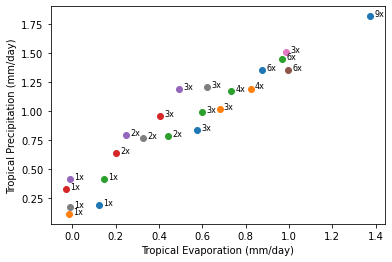

In [74]:
for i in range(len(model)):
    plt.scatter(Tev[i,:], Tpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tropical Evaporation (mm/day)")
    plt.ylabel("Tropical Precipitation (mm/day)")
    #plt.xlim([-1, 3])
    #plt.ylim([-1, 3])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Tev[i,j]+.02, Tpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

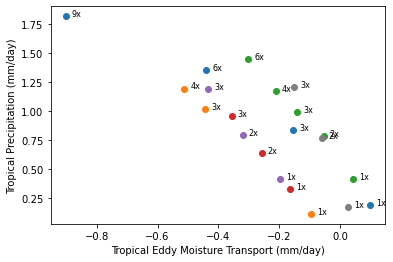

In [75]:
for i in range(len(model)):
    plt.scatter(TMoisture_Div_eddyanomzonalanom[i,:], Tpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tropical Eddy Moisture Transport (mm/day)")
    plt.ylabel("Tropical Precipitation (mm/day)")
    #plt.xlim([-1, 3])
    #plt.ylim([-1, 3])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (TMoisture_Div_eddyanomzonalanom[i,j]+.02, Tpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

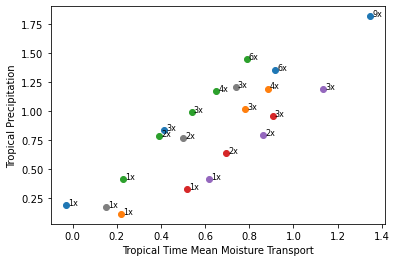

In [76]:
for i in range(len(model)):
    plt.scatter(TMoisture_Div_meananomzonalanom[i,:], Tpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tropical Time Mean Moisture Transport")
    plt.ylabel("Tropical Precipitation")
    #plt.xlim([-1, 3])
    #plt.ylim([-1, 3])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (TMoisture_Div_meananomzonalanom[i,j]+.01, Tpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

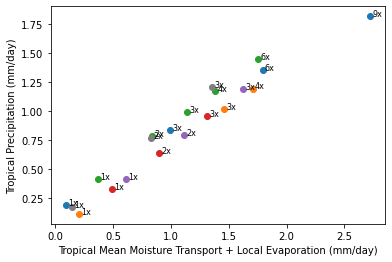

In [77]:
for i in range(len(model)):
    plt.scatter(TMoisture_Div_meananomzonalanom[i,:]+Tev[i,:], Tpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tropical Mean Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Tropical Precipitation (mm/day)")
    #plt.xlim([-1, 3])
    #plt.ylim([-1, 3])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (TMoisture_Div_meananomzonalanom[i,j]+Tev[i,j]+.02, Tpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

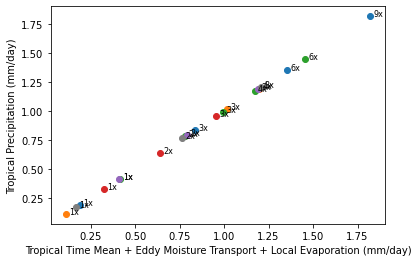

In [78]:
for i in range(len(model)):
    plt.scatter(TMoisture_Div_meananomzonalanom[i,:]+TMoisture_Div_eddyanomzonalanom[i,:]+Tev[i,:], Tpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tropical Time Mean + Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Tropical Precipitation (mm/day)")
    #plt.xlim([-1, 3])
    #plt.ylim([-1, 3])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (TMoisture_Div_meananomzonalanom[i,j]+TMoisture_Div_eddyanomzonalanom[i,j]+Tev[i,j]+.02, Tpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

## Subtropical Precip & P-E moisture budget analysis

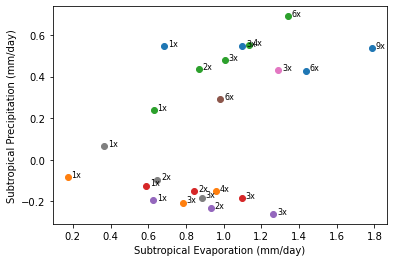

In [79]:
for i in range(len(model)):
    plt.scatter(subev[i,:], subpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Subtropical Evaporation (mm/day)")
    plt.ylabel("Subtropical Precipitation (mm/day)")
    #plt.xlim([-1.8, 1.8])
    #plt.ylim([-1.8, 1.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (subev[i,j]+.02, subpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

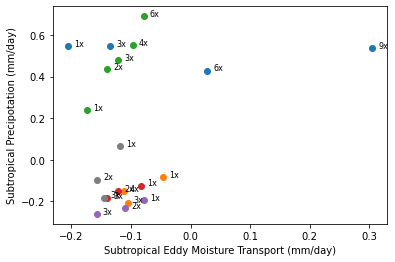

In [80]:
for i in range(len(model)):
    plt.scatter(subMoisture_Div_eddyanomzonalanom[i,:], subpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Subtropical Eddy Moisture Transport (mm/day)")
    plt.ylabel("Subtropical Precipotation (mm/day)")
    #plt.xlim([-1.8, 1.8])
    #plt.ylim([-1.8, 1.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (subMoisture_Div_eddyanomzonalanom[i,j]+.01, subpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

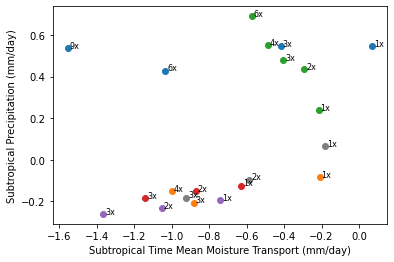

In [81]:
for i in range(len(model)):
    plt.scatter(subMoisture_Div_meananomzonalanom[i,:], subpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Subtropical Time Mean Moisture Transport (mm/day)")
    plt.ylabel("Subtropical Precipitation (mm/day)")
    #plt.xlim([-1.8, 1.8])
    #plt.ylim([-1.8, 1.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (subMoisture_Div_meananomzonalanom[i,j]+.01, subpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

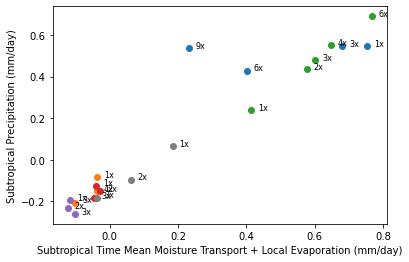

In [82]:
for i in range(len(model)):
    plt.scatter(subMoisture_Div_meananomzonalanom[i,:]+subev[i,:], subpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Subtropical Time Mean Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Subtropical Precipitation (mm/day)")
    #plt.xlim([-1.8, 1.8])
    #plt.ylim([-1.8, 1.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (subMoisture_Div_meananomzonalanom[i,j]+subev[i,j]+.02, subpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

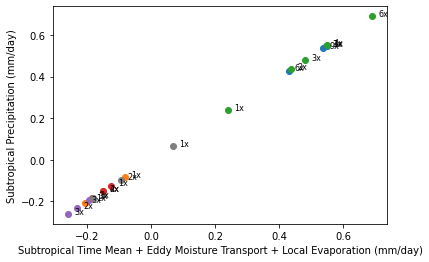

In [83]:
for i in range(len(model)):
    plt.scatter(subMoisture_Div_meananomzonalanom[i,:]+subMoisture_Div_eddyanomzonalanom[i,:]+subev[i,:], subpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Subtropical Time Mean + Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Subtropical Precipitation (mm/day)")
    #plt.xlim([-1.8, 1.8])
    #plt.ylim([-1.8, 1.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (subMoisture_Div_meananomzonalanom[i,j]+subMoisture_Div_eddyanomzonalanom[i,j]+subev[i,j]+.02, subpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

## Mid latitude Precip & P-E moisture budget analysis

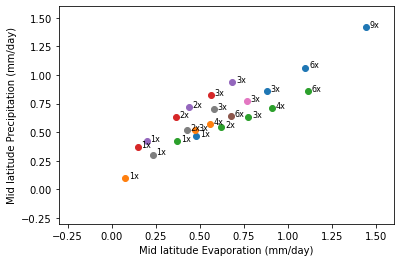

In [84]:
for i in range(len(model)):
    plt.scatter(Mev[i,:], Mpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Mid latitude Evaporation (mm/day)")
    plt.ylabel("Mid latitude Precipitation (mm/day)")
    plt.xlim([-0.3, 1.6])
    plt.ylim([-0.3, 1.6])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Mev[i,j]+.02, Mpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

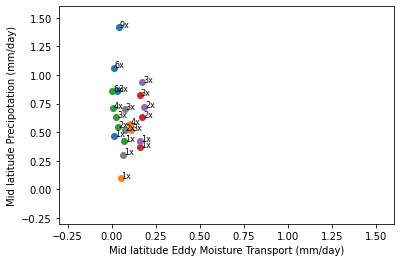

In [85]:
for i in range(len(model)):
    plt.scatter(MMoisture_Div_eddyanomzonalanom[i,:], Mpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Mid latitude Eddy Moisture Transport (mm/day)")
    plt.ylabel("Mid latitude Precipotation (mm/day)")
    plt.xlim([-0.3, 1.6])
    plt.ylim([-0.3, 1.6])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (MMoisture_Div_eddyanomzonalanom[i,j]+.005, Mpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

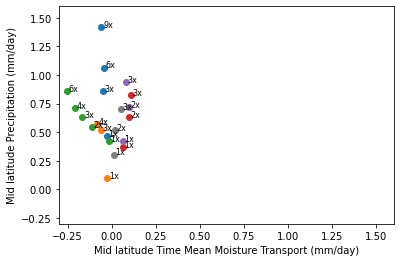

In [86]:
for i in range(len(model)):
    plt.scatter(MMoisture_Div_meananomzonalanom[i,:], Mpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Mid latitude Time Mean Moisture Transport (mm/day)")
    plt.ylabel("Mid latitude Precipitation (mm/day)")
    plt.xlim([-0.3, 1.6])
    plt.ylim([-0.3, 1.6])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (MMoisture_Div_meananomzonalanom[i,j]+.01, Mpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

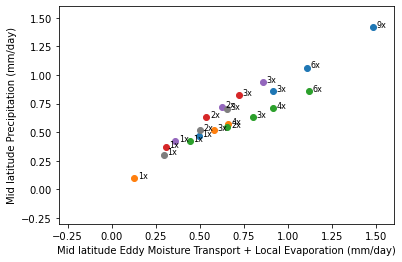

In [87]:
for i in range(len(model)):
    plt.scatter(MMoisture_Div_eddyanomzonalanom[i,:]+Mev[i,:], Mpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Mid latitude Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Mid latitude Precipitation (mm/day)")
    plt.xlim([-0.3, 1.6])
    plt.ylim([-0.3, 1.6])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (MMoisture_Div_eddyanomzonalanom[i,j]+Mev[i,j]+.02, Mpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

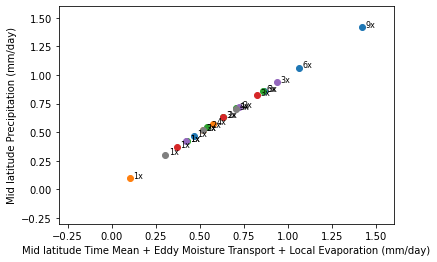

In [88]:
for i in range(len(model)):
    plt.scatter(MMoisture_Div_meananomzonalanom[i,:]+MMoisture_Div_eddyanomzonalanom[i,:]+Mev[i,:], Mpr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Mid latitude Time Mean + Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("Mid latitude Precipitation (mm/day)")
    plt.xlim([-0.3, 1.6])
    plt.ylim([-0.3, 1.6])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (MMoisture_Div_meananomzonalanom[i,j]+MMoisture_Div_eddyanomzonalanom[i,j]+Mev[i,j]+.02, Mpr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

## High latitude Precip & P-E moisture budget analysis

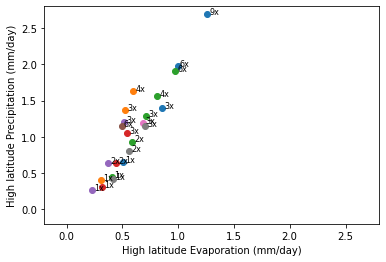

In [89]:
for i in range(len(model)):
    plt.scatter(Pev[i,:], Ppr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("High latitude Evaporation (mm/day)")
    plt.ylabel("High latitude Precipitation (mm/day)")
    plt.xlim([-0.2, 2.8])
    plt.ylim([-0.2, 2.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Pev[i,j]+.02, Ppr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

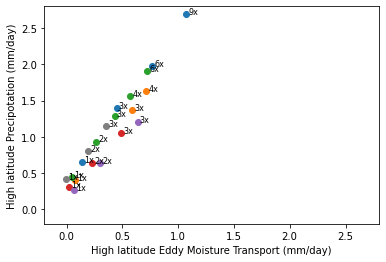

In [90]:
for i in range(len(model)):
    plt.scatter(PMoisture_Div_eddyanomzonalanom[i,:], Ppr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlim([-0.2, 2.8])
    plt.ylim([-0.2, 2.8])
    plt.xlabel("High latitude Eddy Moisture Transport (mm/day)")
    plt.ylabel("High latitude Precipotation (mm/day)")
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (PMoisture_Div_eddyanomzonalanom[i,j]+.02, Ppr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

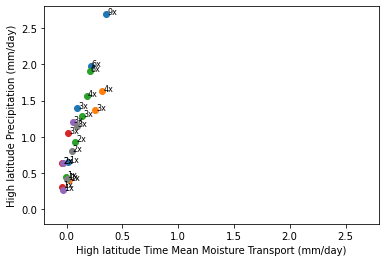

In [91]:
for i in range(len(model)):
    plt.scatter(PMoisture_Div_meananomzonalanom[i,:], Ppr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("High latitude Time Mean Moisture Transport (mm/day)")
    plt.ylabel("High latitude Precipitation (mm/day)")
    plt.xlim([-0.2, 2.8])
    plt.ylim([-0.2, 2.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (PMoisture_Div_meananomzonalanom[i,j]+.01, Ppr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

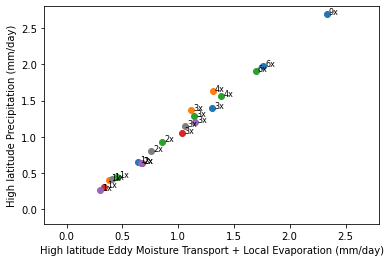

In [92]:
for i in range(len(model)):
    plt.scatter(PMoisture_Div_eddyanomzonalanom[i,:]+Pev[i,:], Ppr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("High latitude Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("High latitude Precipitation (mm/day)")
    plt.xlim([-0.2, 2.8])
    plt.ylim([-0.2, 2.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (PMoisture_Div_eddyanomzonalanom[i,j]+Pev[i,j]+.02, Ppr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

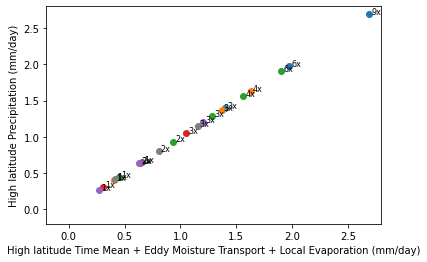

In [93]:
for i in range(len(model)):
    plt.scatter(PMoisture_Div_meananomzonalanom[i,:]+PMoisture_Div_eddyanomzonalanom[i,:]+Pev[i,:], Ppr[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("High latitude Time Mean + Eddy Moisture Transport + Local Evaporation (mm/day)")
    plt.ylabel("High latitude Precipitation (mm/day)")
    plt.xlim([-0.2, 2.8])
    plt.ylim([-0.2, 2.8])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (PMoisture_Div_meananomzonalanom[i,j]+PMoisture_Div_eddyanomzonalanom[i,j]+Pev[i,j]+.02, Ppr[i,j]),fontsize=8)
    #plt.legend(model_name,loc='lower left',fontsize=8)    

## Precip & P-E moisture budget analysis

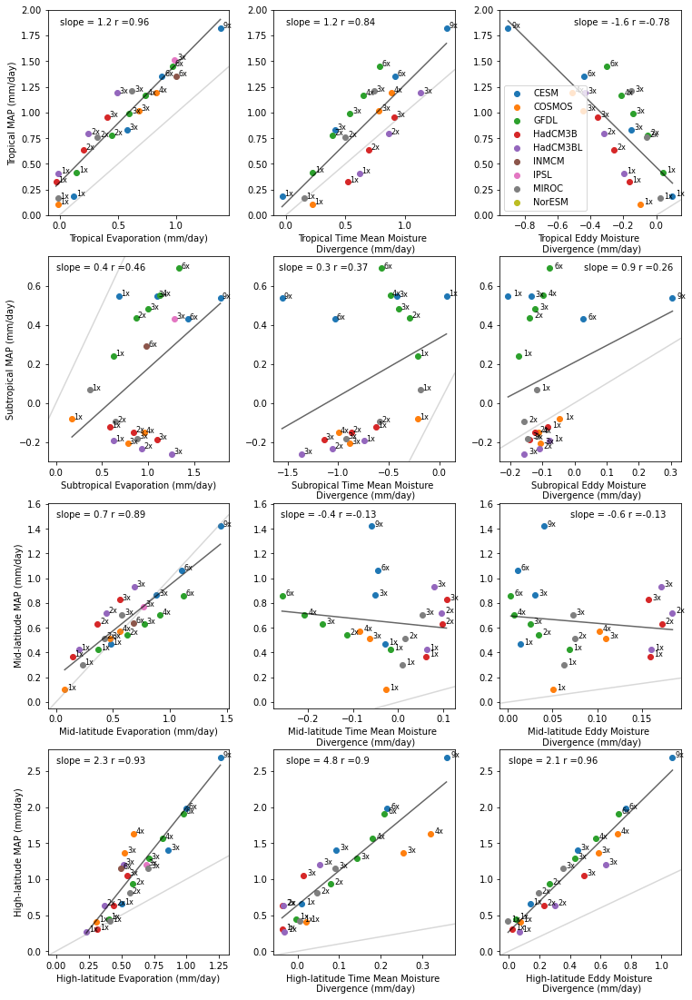

In [94]:
plt.figure(figsize=(11,17)) 
plt.subplots_adjust(left=.1, bottom=.05, right=.98, top=.9,hspace=.2,wspace=.25)
#plt.suptitle("Moisture budget Subtropics",fontweight="bold")

#
# Tropics
#

plt.subplot(4,3,1)
xval=Tev
yval=Tpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey',  label='_nolegend_')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6, label='_nolegend_')
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 1.85), fontsize=10)
plt.ylim([0, 2])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Tropical Evaporation (mm/day)")
plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)
#plt.legend(model_name,loc='lower right', fontsize=10) 
    
plt.subplot(4,3,2)
xval=TMoisture_Div_meananomzonalanom
yval=Tpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 1.85), fontsize=10)
plt.ylim([0, 2])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Tropical Time Mean Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,3)
xval=TMoisture_Div_eddyanomzonalanom
yval=Tpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey', label='_nolegend_')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6, label='_nolegend_')
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (-0.5, 1.85), fontsize=10)
plt.ylim([0, 2])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Tropical Eddy Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)
plt.legend(model_name,loc='lower left', fontsize=10) 

#
# Subtropics
#

plt.subplot(4,3,4)
xval=subev
yval=subpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 0.68), fontsize=10)
plt.ylim([-0.3, 0.75])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Subtropical Evaporation (mm/day)")
plt.ylabel("Subtropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,5)
xval=subMoisture_Div_meananomzonalanom 
yval=subpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (-1.59, 0.68), fontsize=10)
plt.ylim([-0.3, 0.75])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Subropical Time Mean Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,6)
xval=subMoisture_Div_eddyanomzonalanom
yval=subpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0.03, 0.68), fontsize=10)
plt.ylim([-0.3, 0.75])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.015, yval[i,j]),fontsize=8)
plt.xlabel("Subropical Eddy Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

#
# Mid lats
#

plt.subplot(4,3,7)
xval=Mev
yval=Mpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 1.49), fontsize=10)
plt.ylim([-0.05, 1.61])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("Mid-latitude Evaporation (mm/day)")
plt.ylabel("Mid-latitude MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,8)
xval=MMoisture_Div_meananomzonalanom
yval=Mpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (-0.26, 1.49), fontsize=10)
plt.ylim([-0.05, 1.61])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.008, yval[i,j]),fontsize=8)
plt.xlabel("Mid-latitude Time Mean Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,9)
xval=MMoisture_Div_eddyanomzonalanom
yval=Mpr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0.07, 1.49), fontsize=10)
plt.ylim([-0.05, 1.61])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.004, yval[i,j]),fontsize=8)
plt.xlabel("Mid-latitude Eddy Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

#
# high lats
#

plt.subplot(4,3,10)
xval=Pev
yval=Ppr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 2.6), fontsize=10)
plt.ylim([-0.05, 2.8])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("High-latitude Evaporation (mm/day)")
plt.ylabel("High-latitude MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,11)
xval=PMoisture_Div_meananomzonalanom
yval=Ppr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (-0.028, 2.6), fontsize=10)
plt.ylim([-0.05, 2.8])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.01, yval[i,j]),fontsize=8)
plt.xlabel("High-latitude Time Mean Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)

plt.subplot(4,3,12)
xval=PMoisture_Div_eddyanomzonalanom
yval=Ppr
plt.axline((0, 0), slope=1, alpha=0.3, c='grey')
cor=np.corrcoef(xval[~np.isnan(xval)], yval[~np.isnan(xval)])[0,1]
[m_fit,b_fit]=np.polyfit(xval[~np.isnan(xval)],yval[~np.isnan(xval)],1)
x=np.array([np.min(np.min(xval)),np.max(np.max(xval))])
y_fit=m_fit*x[:]+b_fit
plt.plot(x,y_fit,'k', alpha=0.6)
plt.annotate('slope = '+str(np.around(m_fit,decimals=1))+' r ='+str(np.around(cor,decimals=2)), (0, 2.6), fontsize=10)
plt.ylim([-0.05, 2.8])
for i in range(len(model)):
    plt.scatter(xval[i,:], yval[i,:])
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (xval[i,j]+.02, yval[i,j]),fontsize=8)
plt.xlabel("High-latitude Eddy Moisture \n Divergence (mm/day)")
#plt.ylabel("Tropical MAP (mm/day)")
#plt.tick_params(labelsize=12)


plt.savefig('./plots/Fig9_PrecipBudget.pdf', format='pdf')

## Subtropical P-E moisture budget analysis

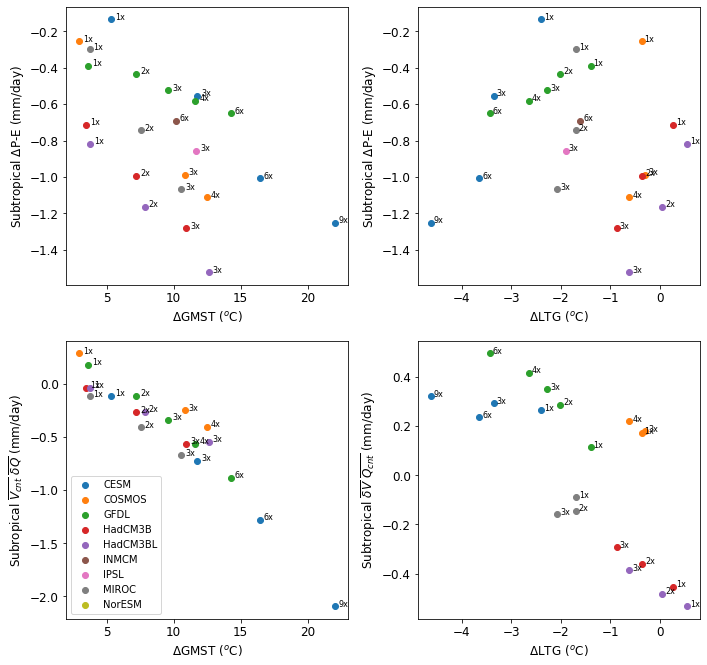

In [95]:
plt.figure(figsize=(10,10)) 
plt.subplots_adjust(left=.1, bottom=.05, right=.98, top=.9,hspace=.2,wspace=.25)
#plt.suptitle("Moisture budget Subtropics",fontweight="bold")


for i in range(len(model)):

    plt.subplot(2,2,1)
    plt.scatter(gst[i,:], subpe[i,:])
    #cor=np.corrcoef(gst[~np.isnan(gst)], subpe[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$GMST ($^{o}$C)",fontsize=12)
    plt.ylabel("Subtropical $\Delta$P-E (mm/day)",fontsize=12)
    plt.tick_params(labelsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (gst[i,j]+.3, subpe[i,j]),fontsize=8)
   
        
    plt.subplot(2,2,2)
    plt.scatter(Meri_grad[i,:], subpe[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("Subtropical $\Delta$P-E (mm/day)",fontsize=12)
    plt.tick_params(labelsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad[i,j]+.06, subpe[i,j]),fontsize=8)

    plt.subplot(2,2,3)
    plt.scatter(gst[i,:], (-subVcntQano[i,:]*86400*1000))
    #cor=np.corrcoef(gst[~np.isnan(gst)], (-subVcntQano[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$GMST ($^{o}$C)",fontsize=12)
    plt.ylabel("Subropical $\overline{V_{cnt}}$ $\overline{\delta Q}$ (mm/day)",fontsize=12)
    plt.tick_params(labelsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (gst[i,j]+.3, -subVcntQano[i,j]*86400*1000),fontsize=8)
    plt.legend(model_name,loc='lower left') 

    plt.subplot(2,2,4)
    plt.scatter(Meri_grad[i,:], -subVanoQcnt[i,:]*86400*1000) #(-subVanoQcnt[i,:]*86400*1000-subVanoQano[i,:]*86400*1000)
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (-subVanoQcnt[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("Subtropical $\overline{\delta V}$ $\overline{Q_{cnt}}$ (mm/day)",fontsize=12)
    plt.tick_params(labelsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad[i,j]+.06, -subVanoQcnt[i,j]*86400*1000),fontsize=8)

#plt.savefig('./plots/Fig10_MoistureBudgetSubtropics.png',dpi=300)
plt.savefig('./plots/Fig10_MoistureBudgetSubtropics.pdf', format='pdf')

## Calculate Zonal Mean Streamfunction

In [96]:
psi = np.zeros([len(lev),len(lat),mod,exp])*np.nan
psi_abs_max = np.zeros([mod,exp])*np.nan
psi_max = np.zeros([mod,exp])*np.nan
psi_min = np.zeros([mod,exp])*np.nan
#psi_max_lower = np.zeros([mod,exp])*np.nan
for k in range(mod):
    for l in range(exp):
            psi[:,:,k,l] = get_psi(v_flip[:,:,:,k,l],dp_naned[:,:,:,k,l],lat,lev)
            if np.max(np.max(np.abs(psi[:,:,k,l])))==0:
                psi_abs_max[k,l] = np.nan
                psi_max[k,l] = np.nan
                psi_min[k,l] = np.nan
                #psi_max_lower[k,l] = np.nan
            else:
                psi_abs_max[k,l] = np.max(np.max(np.abs(psi[:,:,k,l])))
                psi_max[k,l] = np.max(np.max(psi[:,:,k,l]))
                psi_min[k,l] = np.min(np.min(psi[:,:,k,l]))
                #psi_max_lower[k,l] = np.max(np.max(psi[-7:,:,k,l]))   

(80.0, -80.0, 1000.0, 100.0)

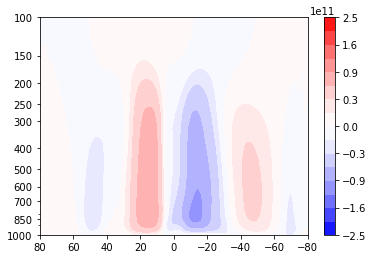

In [97]:
#cs=plt.contourf(p_i_ps_zm,lat,psi)
cs=plt.contourf(lat,lev_flip,psi[:,:,0,0],cmap='bwr',levels=[-250E9, -200E9, -160E9, -120E9, -90E9, -60E9, -30E9, -15E9, 0, 15E9, 30E9, 60E9, 90E9, 120E9, 160E9, 200E9, 250E9])
plt.colorbar(cs)
plt.yscale("log")
#plt.yticks(-np.log([1000, 850, 700, 500, 400, 300, 250, 200, 150])) #  set(gca,'YTick',-log([1000 850 700 500 400 300 250 200 150]));
#plt.yticks(np.log([100, 150, 200, 250, 300, 400, 500, 700, 850, 1000]))
#plt.ylabel([100, 150, 200, 250, 300, 400, 500, 700, 850, 1000])
plt.yticks([100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 1000],['100', '150', '200', '250', '300', '400', '500', '600', '700', '850', '1000'])
#plt.axis([-80, 80, 1000, 150])
plt.axis([80, -80, 1000, 100])

(80.0, -80.0, 1000.0, 100.0)

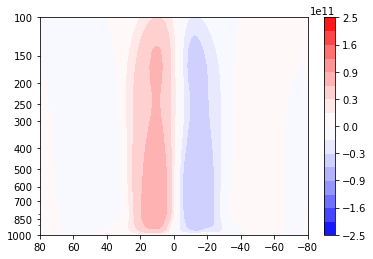

In [98]:
#cs=plt.contourf(p_i_ps_zm,lat,psi)
cs=plt.contourf(lat,lev_flip,psi[:,:,0,-1],cmap='bwr',levels=[-250E9, -200E9, -160E9, -120E9, -90E9, -60E9, -30E9, -15E9, 0, 15E9, 30E9, 60E9, 90E9, 120E9, 160E9, 200E9, 250E9])
plt.colorbar(cs)
plt.yscale("log")
#plt.yticks(-np.log([1000, 850, 700, 500, 400, 300, 250, 200, 150])) #  set(gca,'YTick',-log([1000 850 700 500 400 300 250 200 150]));
#plt.yticks(np.log([100, 150, 200, 250, 300, 400, 500, 700, 850, 1000]))
#plt.ylabel([100, 150, 200, 250, 300, 400, 500, 700, 850, 1000])
plt.yticks([100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 1000],['100', '150', '200', '250', '300', '400', '500', '600', '700', '850', '1000'])
#plt.axis([-80, 80, 1000, 150])
plt.axis([80, -80, 1000, 100])

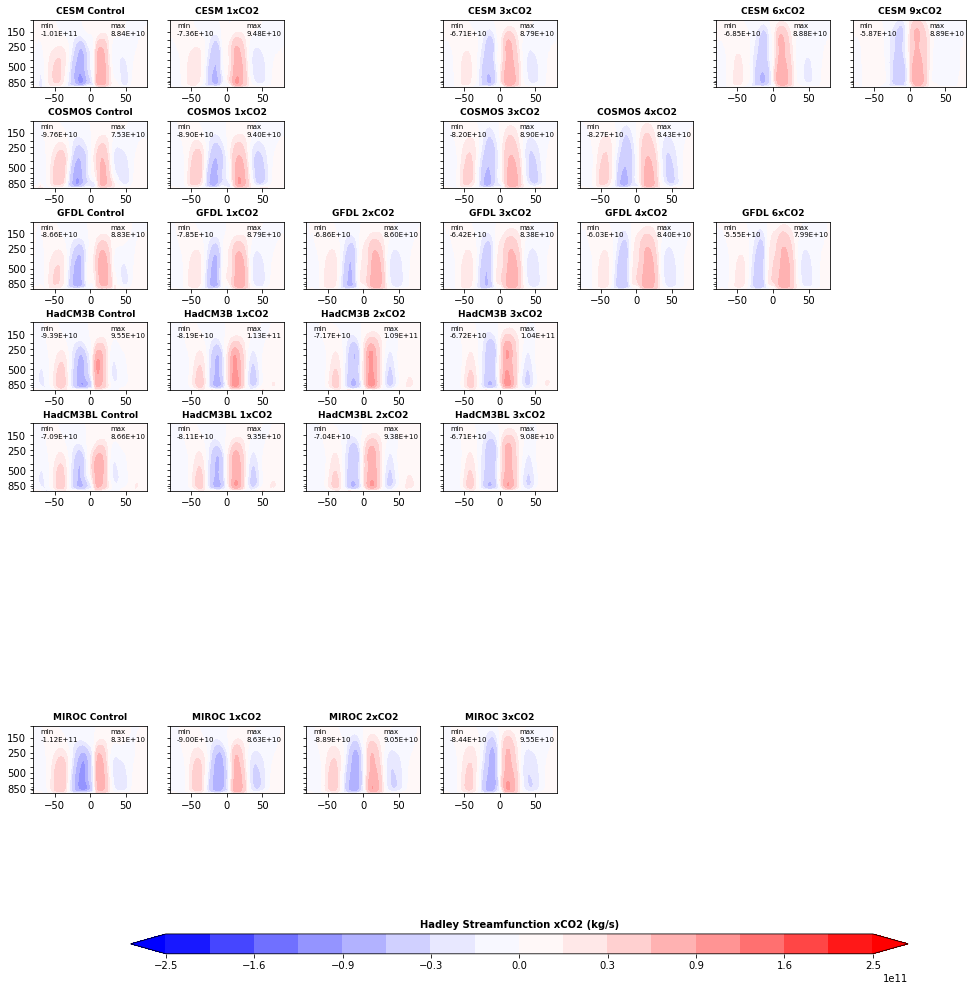

In [99]:
# Make multi panel mean Hadley plot
import decimal
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j]*86400*1000))==False:
            plt.subplot(9,7,run)
            #cs=plt.contourf(lat,lev_flip,psi[:,:,i,j], extend='both', cmap='bwr', levels=np.arange(-1.6E11,1.7E11,0.1E11))
            cs=plt.contourf(lat,lev_flip,psi[:,:,i,j], extend='both', cmap='bwr', levels=[-250E9, -200E9, -160E9, -120E9, -90E9, -60E9, -30E9, -15E9, 0, 15E9, 30E9, 60E9, 90E9, 120E9, 160E9, 200E9, 250E9])
            plt.yscale("log")
            #plt.contour(lon,lat,sftlf[:,:,i,j], levels=[0.5], colors='black', linewidths=2)
            plt.axis([-80, 80, 1000, 100])
            if j==0:
                plt.title(model_name[i]+' '+proj[j][-7:],fontsize=9,fontweight='bold')
                #plt.yticks([150, 250, 500, 850, 1000],['150', '250', '500', '850', '1000'])
                plt.yticks([100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 1000],['', '150', '', '250', '', '', '500', '', '', '850', ''])
                ax=plt.gca()
                ax.text(-70,130, 'min',fontsize=7,color='black')
                ax.text(-70,170, '%.2E' % decimal.Decimal(str(psi_min[i,j])),fontsize=7,color='black')
                ax.text(28,130, 'max',fontsize=7,color='black')
                ax.text(28,170, '%.2E' % decimal.Decimal(str(psi_max[i,j])),fontsize=7,color='black')
            else:
                plt.title(model_name[i]+' '+proj[j][-5:],fontsize=9,fontweight='bold')
                #plt.yticks([])
                plt.yticks([100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 1000],['', '', '', '', '', '', '', '', '', '', ''])
                ax=plt.gca()
                ax.text(-70,130, 'min',fontsize=7,color='black')
                ax.text(-70,170, '%.2E' % decimal.Decimal(str(psi_min[i,j])),fontsize=7,color='black')
                ax.text(28,130, 'max',fontsize=7,color='black')
                ax.text(28,170, '%.2E' % decimal.Decimal(str(psi_max[i,j])),fontsize=7,color='black')
        run=run+1
cbar_ax1 = fig.add_axes([0.12, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Hadley Streamfunction xCO2 (kg/s)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/FigS9_psi.png',dpi=300)
plt.savefig('./plots/FigS9_psi.pdf', format='pdf')

In [100]:
# Create anomalie matrix (ano from PI control)
psi_anom=np.zeros((len(lev_flip),len(lat),len(model),len(proj)-1))
psi_abs_max_anom=np.zeros((len(model),len(proj)-1))
psi_max_anom=np.zeros((len(model),len(proj)-1))
psi_min_anom=np.zeros((len(model),len(proj)-1))
#psi_max_lower_anom=np.zeros((len(model),len(proj)-1))
for p in range(len(proj)-1):
    psi_anom[:,:,:,p]=psi[:,:,:,p+1]-psi[:,:,:,0]    
    psi_abs_max_anom[:,p]=psi_abs_max[:,p+1]-psi_abs_max[:,0]
    psi_max_anom[:,p]=psi_max[:,p+1]-psi_max[:,0]
    psi_min_anom[:,p]=psi_min[:,p+1]-psi_min[:,0]
    #psi_max_lower_anom[:,p]=psi_max_lower[:,p+1]-psi_max_lower[:,0]

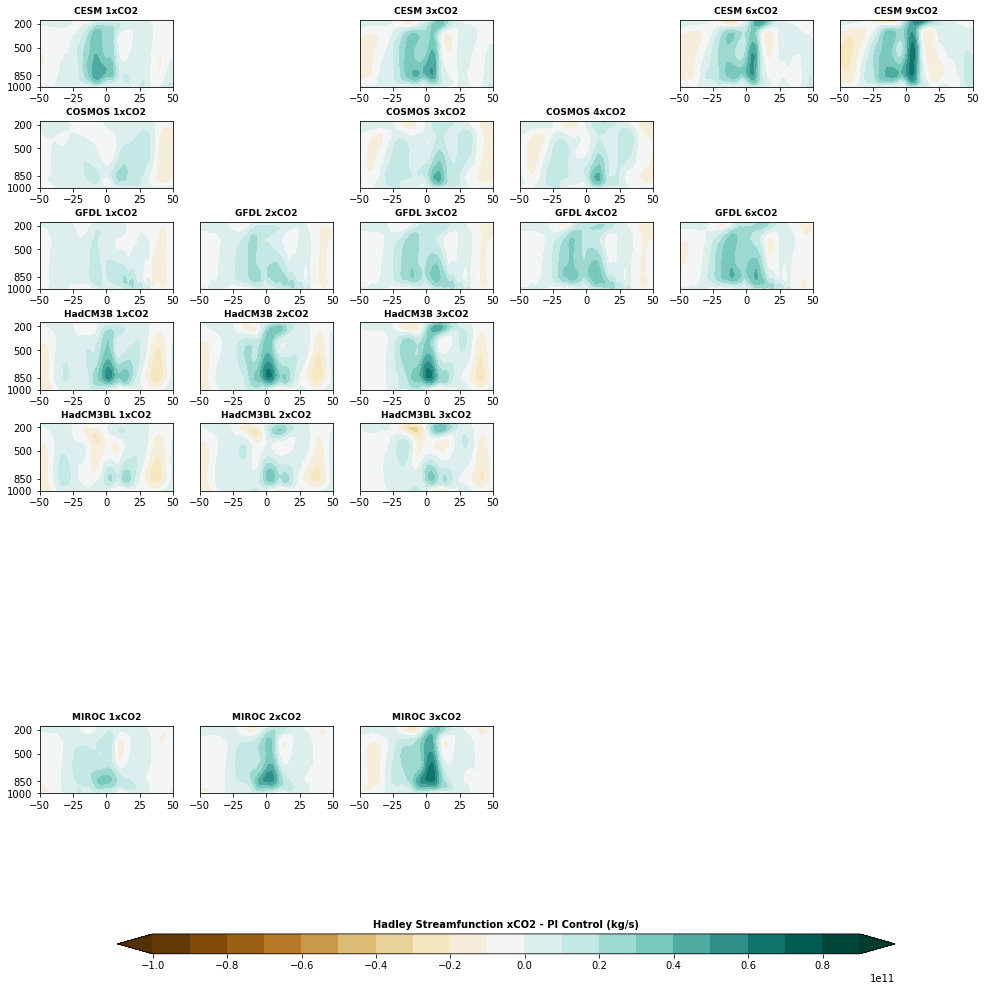

In [101]:
# Make multi panel mean Hadley anomaly plot
fig=plt.figure(figsize=(13.5,13.8))
plt.subplots_adjust(left=.02, bottom=.1, right=.98, top=.98,hspace=.5,wspace=.2)
run=1
for i in range(len(mdir)):
    for j in range(len(proj)-1):
        if np.isnan(np.nanmean(-Moisture_Div_mean[:,:,i,j+1]*86400*1000))==False:
            plt.subplot(9,6,run)
            cs=plt.contourf(lat,lev_flip,psi_anom[:,:,i,j], extend='both', cmap='BrBG', levels=np.arange(-10E10,10E10,1E10))
            #plt.contour(lon,lat,sftlf[:,:,i,j+1], levels=[0.5], colors='black', linewidths=2)
            plt.title(model_name[i]+' '+proj[j+1][-5:],fontsize=9,fontweight='bold')
            plt.axis([-50, 50, 1000, 150])
            if j==0:
                plt.yticks([1000, 850, 500, 200])
            else:
                plt.yticks([])
        run=run+1
cbar_ax1 = fig.add_axes([0.1, 0.04, .8, 0.02])
plt.colorbar(cs,cax=cbar_ax1, orientation="horizontal")
plt.title('Hadley Streamfunction xCO2 - PI Control (kg/s)',fontsize=10,fontweight='bold')
#plt.savefig('./plots/psi_ano.png',dpi=300)
plt.savefig('./plots/psi_ano.pdf', format='pdf')

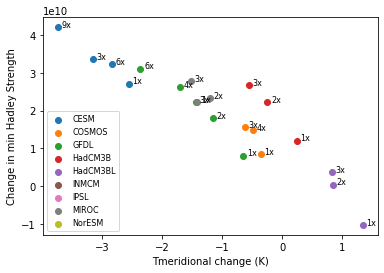

In [102]:
for i in range(len(model)):
    plt.scatter(Meri_grad_South[i,:], psi_min_anom[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tmeridional change (K)")
    plt.ylabel("Change in min Hadley Strength")
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_South[i,j]+.06, psi_min_anom[i,j]),fontsize=8)
    plt.legend(model_name,loc='lower left',fontsize=8)    

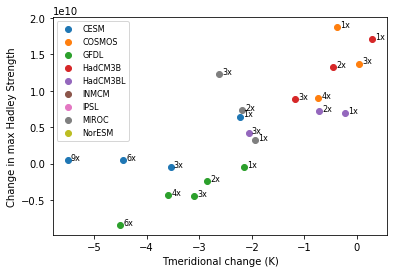

In [103]:
for i in range(len(model)):
    plt.scatter(Meri_grad_North[i,:], psi_max_anom[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tmeridional change (K)")
    plt.ylabel("Change in max Hadley Strength")
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_North[i,j]+.06, psi_max_anom[i,j]),fontsize=8)
    plt.legend(model_name,loc='upper left',fontsize=8)    

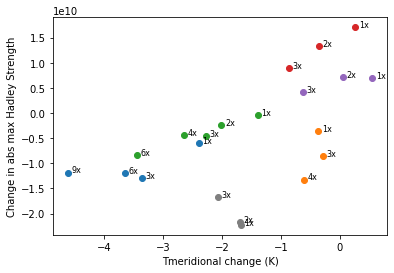

In [104]:
for i in range(len(model)):
    plt.scatter(Meri_grad[i,:], psi_abs_max_anom[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("Tmeridional change (K)")
    plt.ylabel("Change in abs max Hadley Strength")
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad[i,j]+.06, psi_abs_max_anom[i,j]),fontsize=8)

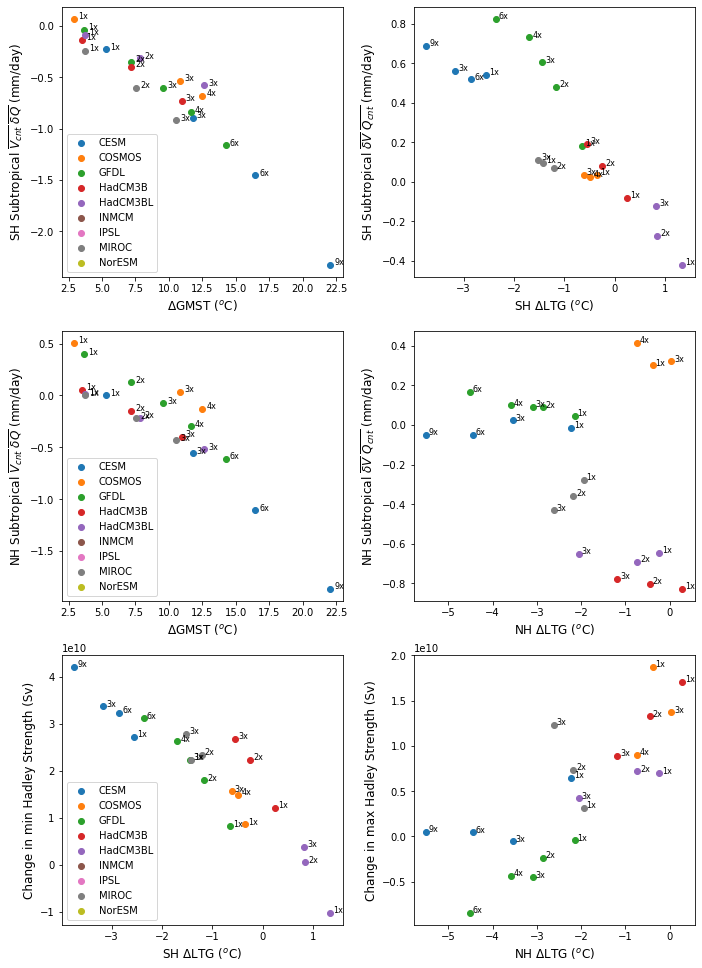

In [105]:
plt.figure(figsize=(10,15)) 
plt.subplots_adjust(left=.1, bottom=.05, right=.98, top=.9,hspace=.2,wspace=.25)
#plt.suptitle("Moisture budget Subtropics",fontweight="bold")


for i in range(len(model)):

    plt.subplot(3,2,1)
    plt.scatter(gst[i,:], (-SMoisture_Div_mean_thermozonalanom [i,:]*86400*1000))
    #cor=np.corrcoef(gst[~np.isnan(gst)], (-subVcntQano[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$GMST ($^{o}$C)",fontsize=12)
    plt.ylabel("SH Subtropical $\overline{V_{cnt}}$ $\overline{\delta Q}$ (mm/day)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (gst[i,j]+.3, -SMoisture_Div_mean_thermozonalanom [i,j]*86400*1000),fontsize=8)
    plt.legend(model_name,loc='lower left') 

    plt.subplot(3,2,2)
    plt.scatter(Meri_grad_South[i,:], -SMoisture_Div_mean_dynamiczonalanom[i,:]*86400*1000) #(-subVanoQcnt[i,:]*86400*1000-subVanoQano[i,:]*86400*1000)
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (-subVanoQcnt[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("SH $\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("SH Subtropical $\overline{\delta V}$ $\overline{Q_{cnt}}$ (mm/day)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_South[i,j]+.06, -SMoisture_Div_mean_dynamiczonalanom[i,j]*86400*1000),fontsize=8)

    plt.subplot(3,2,3)
    plt.scatter(gst[i,:], (-NMoisture_Div_mean_thermozonalanom [i,:]*86400*1000))
    #cor=np.corrcoef(gst[~np.isnan(gst)], (-subVcntQano[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("$\Delta$GMST ($^{o}$C)",fontsize=12)
    plt.ylabel("NH Subtropical $\overline{V_{cnt}}$ $\overline{\delta Q}$ (mm/day)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (gst[i,j]+.3, -NMoisture_Div_mean_thermozonalanom [i,j]*86400*1000),fontsize=8)
    plt.legend(model_name,loc='lower left') 

    plt.subplot(3,2,4)
    plt.scatter(Meri_grad_North[i,:], -NMoisture_Div_mean_dynamiczonalanom[i,:]*86400*1000) #(-subVanoQcnt[i,:]*86400*1000-subVanoQano[i,:]*86400*1000)
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (-subVanoQcnt[~np.isnan(gst)]))[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("NH $\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("NH Subtropical $\overline{\delta V}$ $\overline{Q_{cnt}}$ (mm/day)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_North[i,j]+.06, -NMoisture_Div_mean_dynamiczonalanom[i,j]*86400*1000),fontsize=8)

    plt.subplot(3,2,5)
    plt.scatter(Meri_grad_South[i,:], psi_min_anom[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("SH $\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("Change in min Hadley Strength (Sv)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_South[i,j]+.06, psi_min_anom[i,j]),fontsize=8)
    plt.legend(model_name,loc='lower left') 

    plt.subplot(3,2,6)
    plt.scatter(Meri_grad_North[i,:], psi_max_anom[i,:])
    #cor=np.corrcoef(Meri_grad[~np.isnan(gst)], (subpe)[~np.isnan(gst)])[0,1]
    #plt.title("r "+str(np.around(cor,3)))
    plt.xlabel("NH $\Delta$LTG ($^{o}$C)",fontsize=12)
    plt.ylabel("Change in max Hadley Strength (Sv)",fontsize=12)
    for j in range(len(proj)-1):
        plt.annotate(proj_name[j+1][0:2], (Meri_grad_North[i,j]+.06, psi_max_anom[i,j]),fontsize=8)
        
#plt.savefig('./plots/Fig11_MoistureBudgetSubtropics_SH_and_NH.png',dpi=300)
plt.savefig('./plots/Fig11_MoistureBudgetSubtropics_SH_and_NH.pdf', format='pdf')

## ITCZ Latitude

In [106]:
pr_max = np.zeros([mod,exp])*np.nan
pr_max_index = np.zeros([mod,exp])*np.nan
ITCZ_lat = np.zeros([mod,exp])*np.nan
for k in range(mod):
    for l in range(exp):
            pr_max[k,l]=np.max(przonal[:,k,l]*86400)
            if np.isnan(pr_max[k,l]):
                continue 
            else: 
                #temp_tup=np.where(przonal[:,k,l]*86400==pr_max[k,l])
                #pr_max_index[k,l]=int(temp_tup[0][0])
                #del temp_tup
                pr_max_index[k,l]=np.argwhere(przonal[:,k,l]*86400==pr_max[k,l])
                ITCZ_lat[k,l]=lat[int(pr_max_index[k,l])]
            

Text(0.5, 1.0, 'CESM')

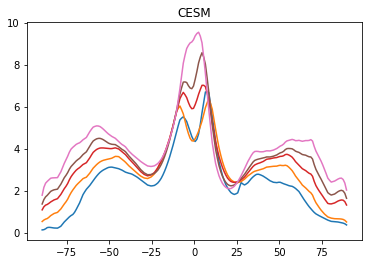

In [107]:
#plt.plot(lat,przonal[:,0,0])
#plt.title(model_name[0]+' '+proj_name[0])
plt.plot(lat,przonal[:,0,:])
plt.title(model_name[0])

Text(0.5, 1.0, 'GFDL')

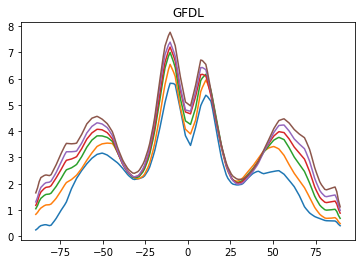

In [108]:
#plt.plot(lat,przonal[:,2,0])
#plt.title(model_name[2]+' '+proj_name[0])
plt.plot(lat,przonal[:,2,:])
plt.title(model_name[2])

Text(0.5, 1.0, 'INMCM')

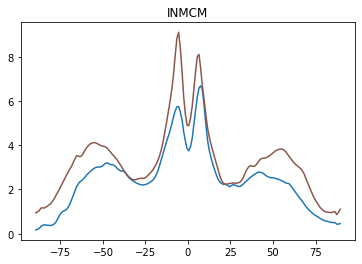

In [109]:
#plt.plot(lat,przonal[:,5,0])
#plt.title(model_name[5]+' '+proj_name[0])
plt.plot(lat,przonal[:,5,:])
plt.title(model_name[5])

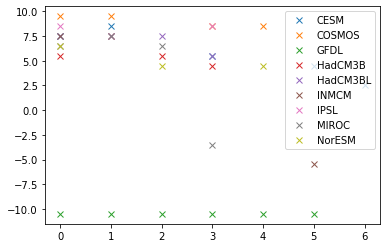

In [110]:
for k in range(mod):
    plt.plot(ITCZ_lat[k,:],'x')
plt.legend(model_name,loc='best') 

## ITCZ width

As defined in Byrne, M. P., & Schneider, T. (2016). Energetic constraints on the width of the intertropical convergence zone. Journal of Climate, 29(13), 4709-4721.

ITCZ_area = 2$\pi$R$^{2}$(sin$\phi_{i}$-sin$\phi_{0}$),
$\phi_{0}$ = latitude that streamfunction in lower troposphere is zero
$\phi_{i}$ = first latitude poleward of $\phi_{0}$ that the absolute
value of the streamfunction has a local maximum

In [111]:
psi_700hPa = psi[20,:,:,:] #lev_flip[20]=691
psi_700hPa_abs_min_equ = np.zeros([mod,exp])*np.nan
psi_700hPa_max = np.zeros([mod,exp])*np.nan
psi_700hPa_min = np.zeros([mod,exp])*np.nan
psi_700hPa_abs_min_equ_index = np.zeros([mod,exp])*np.nan
psi_700hPa_max_index = np.zeros([mod,exp])*np.nan
psi_700hPa_min_index = np.zeros([mod,exp])*np.nan
psi_700hPa_abs_min_equ_lat = np.zeros([mod,exp])*np.nan
psi_700hPa_max_lat = np.zeros([mod,exp])*np.nan
psi_700hPa_min_lat = np.zeros([mod,exp])*np.nan
for k in range(mod):
    for l in range(exp):
            if np.max(np.abs(psi_700hPa[:,k,l]))==0:
                psi_700hPa_abs_min_equ[k,l] = np.nan
                psi_700hPa_max[k,l] = np.nan
                psi_700hPa_min[k,l] = np.nan
            else:
                psi_700hPa_abs_min_equ[k,l] = np.min(np.abs(psi_700hPa[70:110,k,l]))
                psi_700hPa_max[k,l] = np.max(psi_700hPa[:,k,l])
                psi_700hPa_min[k,l] = np.min(psi_700hPa[:,k,l])
                psi_700hPa_abs_min_equ_index[k,l]=np.argwhere(np.abs(psi_700hPa[:,k,l])==psi_700hPa_abs_min_equ[k,l])
                psi_700hPa_max_index[k,l]=np.argwhere(psi_700hPa[:,k,l]==psi_700hPa_max[k,l])
                psi_700hPa_min_index[k,l]=np.argwhere(psi_700hPa[:,k,l]==psi_700hPa_min[k,l])
                psi_700hPa_abs_min_equ_lat[k,l]=lat[int(psi_700hPa_abs_min_equ_index[k,l])]
                psi_700hPa_max_lat[k,l]=lat[int(psi_700hPa_max_index[k,l])]
                psi_700hPa_min_lat[k,l]=lat[int(psi_700hPa_min_index[k,l])]

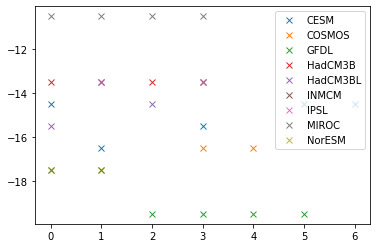

In [112]:
for k in range(mod):
    plt.plot(psi_700hPa_min_lat[k,:],'x')
plt.legend(model_name,loc='best') 

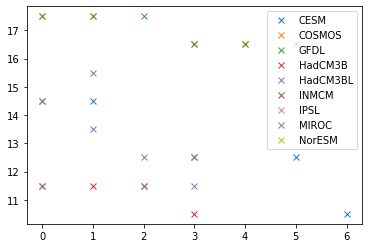

In [113]:
for k in range(mod):
    plt.plot(psi_700hPa_max_lat[k,:],'x')
plt.legend(model_name,loc='best') 

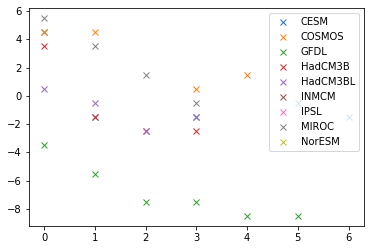

In [114]:
for k in range(mod):
    plt.plot(psi_700hPa_abs_min_equ_lat[k,:],'x')
plt.legend(model_name,loc='best') 

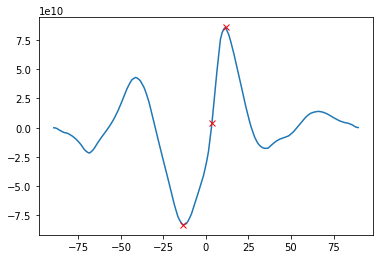

In [127]:
plt.plot(lat,psi_700hPa[:,3,0])
plt.plot(psi_700hPa_abs_min_equ_lat[3,0],psi_700hPa_abs_min_equ[3,0],'rx')
plt.plot(psi_700hPa_min_lat[3,0],psi_700hPa_min[3,0],'rx')
plt.plot(psi_700hPa_max_lat[3,0],psi_700hPa_max[3,0],'rx')

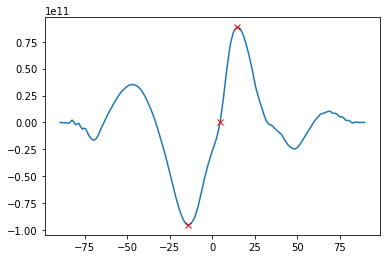

In [116]:
plt.plot(lat,psi_700hPa[:,0,0])
plt.plot(psi_700hPa_abs_min_equ_lat[0,0],psi_700hPa_abs_min_equ[0,0],'rx')
plt.plot(psi_700hPa_min_lat[0,0],psi_700hPa_min[0,0],'rx')
plt.plot(psi_700hPa_max_lat[0,0],psi_700hPa_max[0,0],'rx')

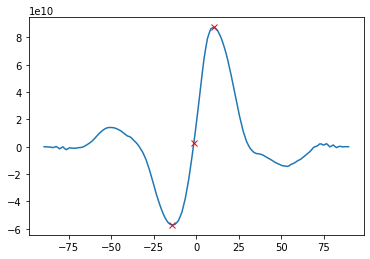

In [117]:
plt.plot(lat,psi_700hPa[:,0,6])
plt.plot(psi_700hPa_abs_min_equ_lat[0,6],psi_700hPa_abs_min_equ[0,6],'rx')
plt.plot(psi_700hPa_min_lat[0,6],psi_700hPa_min[0,6],'rx')
plt.plot(psi_700hPa_max_lat[0,6],psi_700hPa_max[0,6],'rx')

In [128]:
# ITCZ_area = 2$\pi$R$^{2}$(sin$\phi_{i}$-sin$\phi_{0}$),
R=6367442.76
ITCZ_area_NH=2*np.pi*R*(np.sin(np.pi/180*psi_700hPa_max_lat)-np.sin(np.pi/180*psi_700hPa_abs_min_equ_lat))
ITCZ_area_SH=2*np.pi*R*(np.sin(np.pi/180*psi_700hPa_min_lat)-np.sin(np.pi/180*psi_700hPa_abs_min_equ_lat))
ITCZ_area_total=ITCZ_area_NH-ITCZ_area_SH

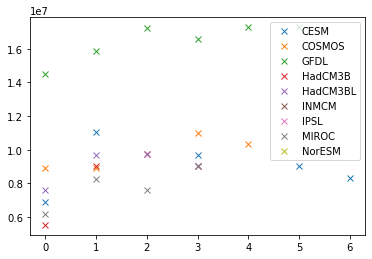

In [129]:
for k in range(mod):
    plt.plot(ITCZ_area_NH[k,:],'x')
plt.legend(model_name,loc='best') 

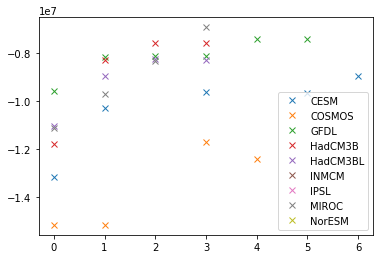

In [130]:
for k in range(mod):
    plt.plot(ITCZ_area_SH[k,:],'x')
plt.legend(model_name,loc='best') 

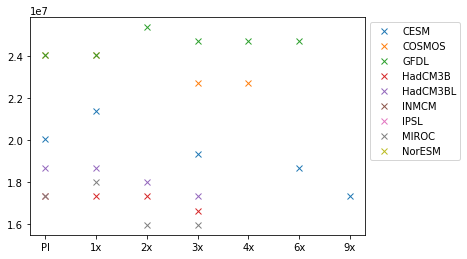

In [143]:
proj_name2=['PI','1x','2x','3x','4x','6x','9x']
for k in range(mod):
    plt.plot(proj_name2,ITCZ_area_total[k,:],'x')
plt.legend(model_name,bbox_to_anchor=(1.3, 1)) 
#plt.legend(model_name+["CMAP"], fontsize=8, loc='best', bbox_to_anchor=(0.68, 0.35), ncol=2, frameon=False)

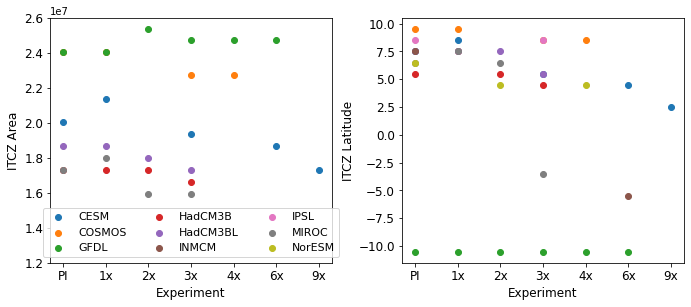

In [146]:
plt.figure(figsize=(10,4)) 
plt.subplots_adjust(left=.1, bottom=.05, right=.98, top=.9,hspace=.2,wspace=.25)
#plt.suptitle("Moisture budget Subtropics",fontweight="bold")


for i in range(len(model)):

    plt.subplot(1,2,1)
    plt.scatter(proj_name2,ITCZ_area_total[i,:])
    plt.xlabel("Experiment",fontsize=12)
    plt.ylabel("ITCZ Area",fontsize=12)
    plt.tick_params(labelsize=12)
    #plt.legend(model_name,loc='lower right') 
    plt.ylim([1.2e7, 2.6e7])
    plt.legend(model_name,loc='lower center',fontsize=11,ncol=3)

    plt.subplot(1,2,2)
    plt.scatter(proj_name2, ITCZ_lat[i,:])
    plt.xlabel("Experiment",fontsize=12)
    plt.ylabel("ITCZ Latitude",fontsize=12)
    #plt.legend(model_name,bbox_to_anchor=(1.5, 1)) 
    plt.tick_params(labelsize=12)
        
plt.savefig('./plots/Fig7new_ITCZ.pdf', format='pdf')

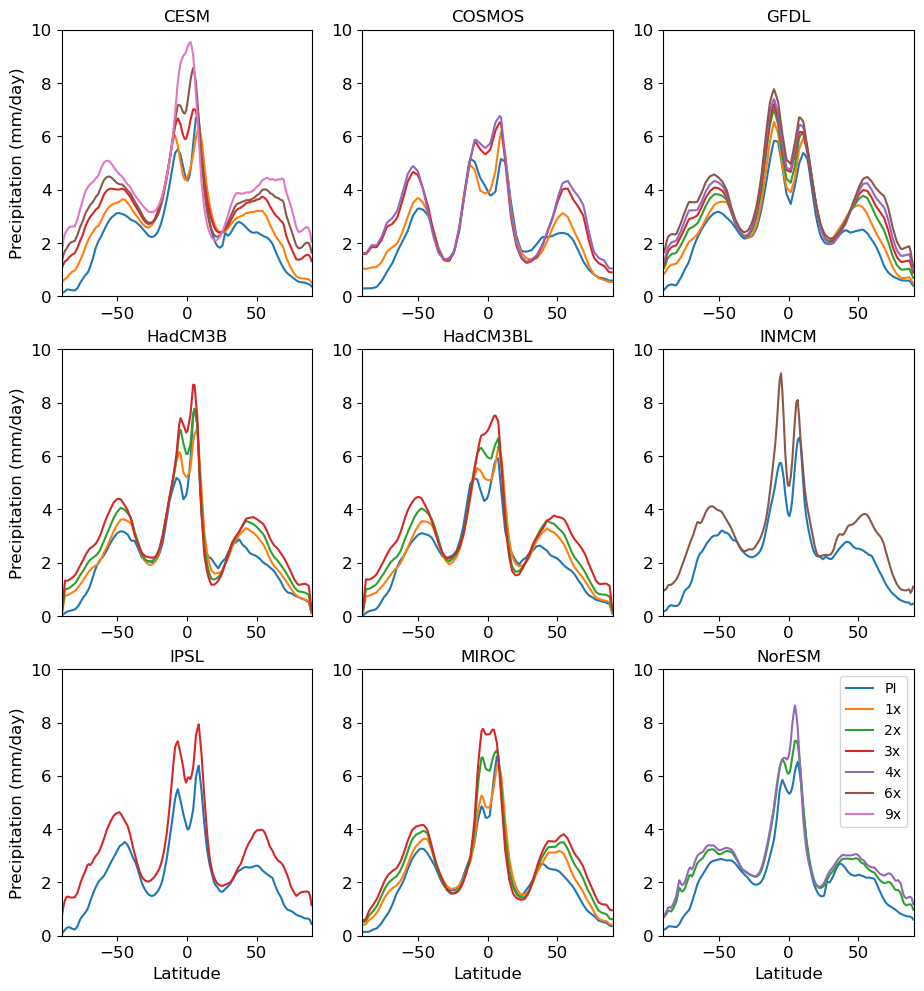

In [139]:
ncols = 3
nrows = 3

fig = plt.figure(figsize=(11, 12), dpi=100) #figsize(weight,height)

for i in range(len(model_name)): 
            ax = fig.add_subplot(nrows, ncols, i+1)
            plt.plot(lat,przonal[:,i,:])
            plt.title(model_name[i])
            plt.xlim([-90, 90])
            plt.ylim([0, 10])
            
            if  i == 0 or i == 3:
                plt.ylabel("Precipitation (mm/day)",fontsize=12)
            elif i == 7 or i == 8:
                plt.xlabel("Latitude",fontsize=12)
            elif i == 6:
                plt.xlabel("Latitude",fontsize=12) 
                plt.ylabel("Precipitation (mm/day)",fontsize=12)
            else:
                continue



plt.legend(proj_name2)
plt.savefig('./plots/Fig7new_ZonalMeanPrecip.pdf', format='pdf')